# Stock Market Visualization

In [1]:
# Import Modules

import numpy as np
import pandas as pd
import os
import random
import copy
import matplotlib.pyplot as plt
import pandas

The code snippet you provided imports the following modules:

numpy is a library for scientific computing with Python. It contains a high-level interface to arrays, matrices, and related routines.
pandas is a library for data analysis in Python. It provides high-performance, easy-to-use data structures and data analysis tools.
os is a module that provides functions for interacting with the operating system.
random is a module that provides functions for generating random numbers.
copy is a module that provides functions for copying objects.
matplotlib.pyplot is a library for creating plots in Python.
pandas is a library for data analysis in Python. It provides high-level data structures and data analysis tools.
The import statement is used to import a module into the current namespace. This allows you to use the functions and variables defined in the module without having to specify the full path to the module. For example, after importing the numpy module, you can use the np.array() function to create an array.

## Read the data from Stock folder

### Check how much data is available? 

In [2]:
from subprocess import check_output
print(check_output(["ls", "../input"]).decode("utf8"))

Data
ETFs
Stocks



The code snippet you provided imports the check_output() function from the subprocess module and then uses it to list the contents of the directory ../input. The check_output() function takes a list of arguments as its first argument and returns the output of the command as a string. The decode() function is used to decode the string from bytes to a unicode string.

In this case, the check_output() function will list the contents of the directory ../input and decode the output to a unicode string. The output of the code snippet will be a list of the files and directories in the directory ../input.

In [3]:
os.chdir('../input/Data/Stocks/')
list = os.listdir()
number_files = len(list)
print(number_files)

7195


The code snippet you provided does the following:

It uses the os.chdir() function to change the current working directory to ../input/Data/Stocks/.
It uses the os.listdir() function to list the contents of the current working directory.
It uses the len() function to get the length of the list of files.
It prints the number of files.


### Choose 8 random stock data for analysis

In [4]:
#filenames = [x for x in os.listdir("./Stocks/") if x.endswith('.txt') and os.path.getsize(x) > 0]
filenames = random.sample([x for x in os.listdir() if x.endswith('.txt') 
                           and os.path.getsize(os.path.join('',x)) > 0], 8)
print(filenames)

['icui.us.txt', 'tpgh-u.us.txt', 'emn.us.txt', 'vntr.us.txt', 'ako-b.us.txt', 'hmc.us.txt', 'tga.us.txt', 'pran.us.txt']


The code snippet first defines a variable called filenames and assigns it a list of file names. These file names are obtained by using the os.listdir() function to list all the files in the ./Stocks/ directory. Only the file names that end with .txt and have a file size greater than 0 are included in the list. However, please note that the line is currently commented out because it starts with a #.

Next, the code snippet defines another variable called filenames and assigns it a list of 8 random file names. These file names are selected from all the files in the current directory (the directory where the script is running) that end with .txt and have a file size greater than 0. The random.sample() function is used to randomly select 8 file names from this list.

Finally, the code snippet prints the filenames list, which contains the 8 randomly selected file names.

Overall, the code retrieves a list of file names that meet certain criteria (ending with .txt and having a non-zero file size) from a specific directory or the current directory, and then selects 8 random file names from that list. Finally, it prints the selected file names.

### Read data into dataframes

In [5]:
data = []
for filename in filenames:
    df = pd.read_csv(os.path.join('',filename), sep=',')
    label, _, _ = filename.split(sep='.')
    df['Label'] = label
    df['Date'] = pd.to_datetime(df['Date'])

    data.append(df)

It creates an empty list called data to store the data from the files.
It starts a loop that iterates over each file name in the filenames list.
Inside the loop, it reads the contents of each file as a CSV (comma-separated values) file using the pandas library's read_csv() function. The file path is constructed using os.path.join() by joining an empty string with the current file name.
It assigns the file name without the file extension to the variable label and ignores the other parts of the file name by using the split() function with the separator (or delimiter) set as .. The resulting parts are assigned to three variables, but we are only interested in the first one, which is the label.
It adds a new column to the DataFrame (df) called Label and assigns it the value of the label variable, representing the label or identifier associated with the data in the file.
It adds another new column to the DataFrame called Date and converts the values in the Date column of the DataFrame to datetime format using the pd.to_datetime() function from the pandas library.
Finally, it appends the DataFrame (df) to the data list, which stores all the DataFrames created from the files.
In summary, the code reads each file from the filenames list, extracts the label from the file name, adds the label and converts the Date column to datetime format, and then appends the resulting DataFrame to the data list.

In [6]:
data[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label
0,2005-02-25,29.20,30.03,29.20,29.91,71904,0,icui
1,2005-02-28,30.03,30.71,28.65,30.62,156595,0,icui
2,2005-03-01,30.84,32.18,30.62,31.98,390167,0,icui
3,2005-03-02,31.75,33.59,31.75,32.46,297265,0,icui
4,2005-03-03,32.06,33.39,31.89,33.24,254435,0,icui


# DOne till here

The code data[0].head() retrieves the first few rows of data from the DataFrame stored at index 0 in the "data" list.

Here's a breakdown of what it does:

data[0] accesses the element at index 0 in the "data" list. Since the "data" list contains DataFrames, data[0] refers to the first DataFrame in the list.
.head() is a function that can be called on a DataFrame. It retrieves the first few rows of the DataFrame. By default, it returns the first 5 rows.
So, data[0].head() essentially retrieves the first 5 rows of data from the first DataFrame in the "data" list.

In [7]:
print(len(data))

8


The code print(len(data)) calculates and displays the number of elements in the "data" list.

Here's a breakdown of what it does:

len(data) calculates the length of the "data" list, which refers to the number of elements in the list.
print() is a function used to display the value within the parentheses on the console or output screen.
print(len(data)) calls the print() function with len(data) as its argument, which represents the length of the "data" list.
So, print(len(data)) simply outputs the number of elements in the "data" list to the console or output screen.

## Add various Technical Indicators in the dataframe

There are many types of Technical Indicators. 
The Technical Indicators we are considering are:
- RSI, Volume (plain), Bollinger Bands, Aroon, Price Volume Trend, acceleration bands
- Stochastic, Chaikin Money Flow, Parabolic SAR, Rate of Change, Volume weighted average Price, momentum
- Commodity Channel Index, On Balance Volume, Keltner Channels, Triple Exponential Moving Average, Normalized Averager True Range ,directional movement indicators
- MACD, Money flowindex , Ichimoku, William %R, Volume MINMAX, adaptive moving average

In [8]:
TechIndicator = copy.deepcopy(data)

The code TechIndicator = copy.deepcopy(data) creates a deep copy of the "data" list and assigns it to a new variable called "TechIndicator".

Here's a breakdown of what it does:

copy is a module in Python's standard library that provides functions for creating copies of objects.
deepcopy() is a function from the copy module that performs a deep copy of an object. A deep copy creates a completely independent copy of the object, including all its nested elements.
TechIndicator is a new variable created to store the copied data.
copy.deepcopy(data) creates a deep copy of the "data" list, including all its elements, and assigns it to the variable "TechIndicator".
In summary, the code creates a deep copy of the "data" list and assigns it to a new variable called "TechIndicator". This means that "TechIndicator" will have the same elements as "data", but any modifications made to "TechIndicator" will not affect the original "data" list.

### Calculation of Relative Strength Index (RSI)

In [9]:
def rsi(values):
    up = values[values>0].mean()
    down = -1*values[values<0].mean()
    return 100 * up / (up + down)


The code you provided defines a function called rsi that calculates the Relative Strength Index (RSI) based on a given set of values.

The function takes a single argument called values, which represents the input values for which we want to calculate the RSI.

The function then does the following:

It filters the values array to only include values greater than zero. It calculates the mean (average) of these filtered values and assigns it to the variable up. This represents the average positive change in the values.
It filters the values array to only include values less than zero. It calculates the mean (average) of these filtered values and assigns it to the variable down. Multiplying it by -1 converts negative values to positive values. This represents the average negative change in the values.
It calculates the RSI by dividing the average positive change (up) by the sum of the average positive change (up) and the average negative change (down). It then multiplies the result by 100 to express it as a percentage. The RSI is a common indicator used in technical analysis to assess the strength or weakness of a trend.
In summary, the code defines a function that calculates the RSI based on a given set of values. It calculates the average positive change and average negative change, and then returns the RSI as a percentage.

In [10]:
# Add Momentum_1D column for all 15 stocks.
# Momentum_1D = P(t) - P(t-1)
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum_1D'] = (TechIndicator[stock]['Close']-TechIndicator[stock]['Close'].shift(1)).fillna(0)
    TechIndicator[stock]['RSI_14D'] = TechIndicator[stock]['Momentum_1D'].rolling(center=False, window=14).apply(rsi).fillna(0)
TechIndicator[0].tail(5)

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Currently, 'apply' passes the values as ndarrays to the applied function. In the future, this will change to passing it as Series objects. You need to specify 'raw=True' to keep the current behaviour, and you can pass 'raw=False' to silence this warning
  """
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: Mean of empty slice.
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice.
  


,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D
3196,2017-11-06,191.60,194.80,190.35,193.50,90089,0,icui,2.60,46.712288
3197,2017-11-07,194.00,195.40,191.35,193.55,89016,0,icui,0.05,45.329670
3198,2017-11-08,192.75,195.05,188.40,188.75,109448,0,icui,-4.80,41.058941
3199,2017-11-09,187.75,188.00,180.45,186.10,153379,0,icui,-2.65,41.116751
3200,2017-11-10,204.75,205.95,196.33,205.05,362396,0,icui,18.95,62.700965


The provided code performs several steps. First, it adds two new columns, "Momentum_1D" and "RSI_14D," to each DataFrame in the "TechIndicator" list. These columns will store the values for the one-day momentum and 14-day RSI indicators, respectively. Next, it iterates over each DataFrame in the "TechIndicator" list and performs calculations for each stock. Within this loop, it calculates the one-day momentum by subtracting the previous day's closing price from the current day's closing price, and stores the result in the "Momentum_1D" column. Any missing values in this column are filled with 0. Additionally, it calculates the 14-day RSI by applying a custom function called "rsi" to the values in the "Momentum_1D" column over a rolling window of size 14. The result is stored in the "RSI_14D" column, and any missing values in this column are also filled with 0. Finally, the code prints the last 5 rows of data from the first DataFrame in the "TechIndicator" list. Overall, this code adds and populates columns for momentum and RSI indicators for each stock's closing prices, providing additional insights into the data.

In [11]:
### Calculation of Volume (Plain)m

In [12]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Volume_plain'] = TechIndicator[stock]['Volume'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain
3196,2017-11-06,191.60,194.80,190.35,193.50,90089,0,icui,2.60,46.712288,90089
3197,2017-11-07,194.00,195.40,191.35,193.55,89016,0,icui,0.05,45.329670,89016
3198,2017-11-08,192.75,195.05,188.40,188.75,109448,0,icui,-4.80,41.058941,109448
3199,2017-11-09,187.75,188.00,180.45,186.10,153379,0,icui,-2.65,41.116751,153379
3200,2017-11-10,204.75,205.95,196.33,205.05,362396,0,icui,18.95,62.700965,362396


The code you provided performs the following steps:

It iterates over the elements in the TechIndicator list using a for loop with the variable stock. The loop ranges from 0 to the length of the TechIndicator list.

Inside the loop, for each DataFrame at index stock in the TechIndicator list:

It creates a new column called Volume_plain in the DataFrame.
The Volume_plain column contains the values from the Volume column of the DataFrame, but any missing values (NaN) are filled with 0.
Finally, it prints the last 5 rows of data from the first DataFrame in the TechIndicator list (TechIndicator[0]) using the .tail() function.

In summary, the code iterates over the TechIndicator list, adds a new column called Volume_plain to each DataFrame, and populates it with the Volume values, filling any missing values with 0. It then displays the last 5 rows of data from the first DataFrame in the TechIndicator list. This code essentially modifies the DataFrames by adding a new column and provides a summary view of the data.

### Calculation of Bollinger Bands

In [13]:
def bbands(price, length=30, numsd=2):
    """ returns average, upper band, and lower band"""
    #ave = pd.stats.moments.rolling_mean(price,length)
    ave = price.rolling(window = length, center = False).mean()
    #sd = pd.stats.moments.rolling_std(price,length)
    sd = price.rolling(window = length, center = False).std()
    upband = ave + (sd*numsd)
    dnband = ave - (sd*numsd)
    return np.round(ave,3), np.round(upband,3), np.round(dnband,3)

The code you provided defines a function called "bbands" that calculates Bollinger Bands for a given price series.

Here's a breakdown of what it does:

The function takes three arguments: "price" (the price series for which to calculate the Bollinger Bands), "length" (the window length for calculating the average and standard deviation), and "numsd" (the number of standard deviations to use for calculating the upper and lower bands).
It provides a brief description of the function as a docstring, indicating that it returns the average, upper band, and lower band.
The code calculates the rolling average (mean) of the price series using price.rolling(window=length, center=False).mean() and assigns it to the variable "ave". This calculates the average value for each window of length "length" in the price series.
It calculates the rolling standard deviation of the price series using price.rolling(window=length, center=False).std() and assigns it to the variable "sd". This calculates the standard deviation for each window of length "length" in the price series.
It calculates the upper band by adding "numsd" times the standard deviation to the average: ave + (sd * numsd). This represents the upper boundary of the Bollinger Bands.
It calculates the lower band by subtracting "numsd" times the standard deviation from the average: ave - (sd * numsd). This represents the lower boundary of the Bollinger Bands.
Finally, it returns the calculated values of the average, upper band, and lower band as a tuple, with each value rounded to 3 decimal places using np.round().
In summary, the code defines a function that calculates Bollinger Bands for a given price series. It uses the rolling average and standard deviation to calculate the upper and lower bands, and returns the average, upper band, and lower band as rounded values. Bollinger Bands are a popular technical analysis tool used to identify potential price levels of overbought and oversold conditions in financial markets.

In [14]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['BB_Middle_Band'], TechIndicator[stock]['BB_Upper_Band'], TechIndicator[stock]['BB_Lower_Band'] = bbands(TechIndicator[stock]['Close'], length=20, numsd=1)
    TechIndicator[stock]['BB_Middle_Band'] = TechIndicator[stock]['BB_Middle_Band'].fillna(0)
    TechIndicator[stock]['BB_Upper_Band'] = TechIndicator[stock]['BB_Upper_Band'].fillna(0)
    TechIndicator[stock]['BB_Lower_Band'] = TechIndicator[stock]['BB_Lower_Band'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band
3196,2017-11-06,191.60,194.80,190.35,193.50,90089,0,icui,2.60,46.712288,90089,189.750,191.877,187.623
3197,2017-11-07,194.00,195.40,191.35,193.55,89016,0,icui,0.05,45.329670,89016,190.000,192.268,187.732
3198,2017-11-08,192.75,195.05,188.40,188.75,109448,0,icui,-4.80,41.058941,109448,190.085,192.267,187.903
3199,2017-11-09,187.75,188.00,180.45,186.10,153379,0,icui,-2.65,41.116751,153379,190.072,192.277,187.868
3200,2017-11-10,204.75,205.95,196.33,205.05,362396,0,icui,18.95,62.700965,362396,190.950,194.888,187.012


The code you provided performs the following steps:

It iterates over the range of numbers from 0 to the length of the "TechIndicator" list using a for loop with the variable "stock". This loop allows us to perform operations on each stock in the "TechIndicator" list.
Inside the loop, for each stock at index "stock" in the "TechIndicator" list:
It calls the function "bbands" to calculate the Bollinger Bands for the stock's closing prices ("TechIndicator[stock]['Close']") with a length of 20 and a standard deviation of 1. The calculated values are assigned to three new columns: "BB_Middle_Band," "BB_Upper_Band," and "BB_Lower_Band," in the DataFrame of the current stock.
It fills any missing values (NaN) in the "BB_Middle_Band," "BB_Upper_Band," and "BB_Lower_Band" columns with 0 using the .fillna(0) function.
Finally, it prints the last few rows of data from the first DataFrame in the "TechIndicator" list (TechIndicator[0]) using the .tail() function.
In summary, the code calculates and adds Bollinger Bands for each stock in the "TechIndicator" list. It iterates through each stock, calls the "bbands" function to calculate the Bollinger Bands based on the stock's closing prices, and stores the results in new columns. Any missing values in the Bollinger Bands columns are filled with 0. The code then prints the last few rows of data for the first stock in the "TechIndicator" list.

### Calculation of Aroon Oscillator

In [15]:
def aroon(df, tf=25):
    aroonup = []
    aroondown = []
    x = tf
    while x< len(df['Date']):
        aroon_up = ((df['High'][x-tf:x].tolist().index(max(df['High'][x-tf:x])))/float(tf))*100
        aroon_down = ((df['Low'][x-tf:x].tolist().index(min(df['Low'][x-tf:x])))/float(tf))*100
        aroonup.append(aroon_up)
        aroondown.append(aroon_down)
        x+=1
    return aroonup, aroondown

The code provided introduces a function named "aroon" which aims to compute the Aroon indicators for a DataFrame that contains financial data. These indicators help in analyzing the strength and direction of trends in financial markets.

The function requires two arguments: "df," which represents the DataFrame containing the financial data, and "tf" (with a default value of 25), which denotes the time frame or period used for calculating the Aroon indicators.

Inside the function, two empty lists, "aroonup" and "aroondown," are initialized. These lists will hold the computed Aroon values.

The function then sets a variable named "x" to the value of "tf." This variable will be used to iterate through the DataFrame while calculating the Aroon indicators. The code enters a while loop that continues until the variable "x" reaches the length of the 'Date' column in the DataFrame. This ensures that calculations are performed within the available data range.

During each iteration of the loop, the Aroon Up value is computed by finding the index of the highest value in the 'High' column within the previous "tf" number of periods. This index is divided by "tf" and multiplied by 100 to obtain a percentage value.

Similarly, the Aroon Down value is calculated by determining the index of the lowest value in the 'Low' column within the previous "tf" number of periods. This index is also divided by "tf" and multiplied by 100.

The calculated Aroon Up and Aroon Down values are appended to the "aroonup" and "aroondown" lists, respectively. After each iteration, the variable "x" is incremented by 1, allowing the loop to progress to the next period.Finally, the function returns the lists "aroonup" and "aroondown," which contain the computed Aroon Up and Aroon Down values, respectively.

To summarize, the provided code implements a function that calculates Aroon indicators based on a given DataFrame of financial data. It iterates through the DataFrame, computes the Aroon Up and Aroon Down values for each period within the specified time frame, and stores these values in separate lists. The function ultimately returns these lists, providing a means to assess trend strength and direction in financial markets.

In [16]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 25
    up, down = aroon(TechIndicator[stock])
    aroon_list = [x - y for x, y in zip(up,down)]
    if len(aroon_list)==0:
        aroon_list = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Aroon_Oscillator'] = aroon_list
    else:
        TechIndicator[stock]['Aroon_Oscillator'] = listofzeros+aroon_list


The provided code executes a sequence of operations to calculate and assign Aroon Oscillator values for each stock in the "TechIndicator" list. Here's a breakdown of its functionality:

The code initiates a for loop that iterates through the range of numbers from 0 to the length of the "TechIndicator" list. This loop allows the subsequent steps to be performed on each stock individually.

Within the loop, for each stock at the current index "stock" in the "TechIndicator" list:

A list named "listofzeros" is created, consisting of 25 zeros. This list will be used later in the code.
The function "aroon" is called with the current stock's data as an argument. This function calculates the Aroon Up and Aroon Down values specific to the stock and returns them as separate lists, assigned to the variables "up" and "down" respectively.
A new list called "aroon_list" is formed using a list comprehension. It subtracts each corresponding element in the "up" and "down" lists to calculate the Aroon Oscillator values.
The code then checks if the length of "aroon_list" is zero. If it is, it implies that no Aroon values were calculated for the stock. In this case, a new list is created with the same length as the stock's data (TechIndicator[stock]), consisting of zeros. This new list is assigned to "aroon_list".

On the other hand, if the length of "aroon_list" is not zero, it indicates that Aroon values were successfully calculated. In this case, the code proceeds to the next step without modifying "aroon_list".

Finally, the code assigns the values of "aroon_list" to a new column called "Aroon_Oscillator" in the DataFrame specific to the current stock (TechIndicator[stock]). If "aroon_list" is not empty, its values are appended to the beginning of "listofzeros" using list concatenation. If "aroon_list" is empty, meaning no Aroon values were calculated, the "Aroon_Oscillator" column is assigned the values of "aroon_list" directly.

In summary, the code iterates through the stocks in the "TechIndicator" list, calculates Aroon Oscillator values for each stock, and assigns these values to the corresponding DataFrame. It handles cases where Aroon values were not calculated by either assigning zeros or the calculated values to the "Aroon_Oscillator" column. The Aroon Oscillator is used as an indicator in technical analysis to identify the strength and direction of a trend in financial markets.

### Calculation of Price Volume Trend

PVT = [((CurrentClose - PreviousClose) / PreviousClose) x Volume] + PreviousPVT

In [17]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]["PVT"] = (TechIndicator[stock]['Momentum_1D']/ TechIndicator[stock]['Close'].shift(1))*TechIndicator[stock]['Volume']
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"]-TechIndicator[stock]["PVT"].shift(1)
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT
3196,2017-11-06,191.60,194.80,190.35,193.50,90089,0,icui,2.60,46.712288,90089,189.750,191.877,187.623,60.0,1201.330630
3197,2017-11-07,194.00,195.40,191.35,193.55,89016,0,icui,0.05,45.329670,89016,190.000,192.268,187.732,24.0,-1203.983258
3198,2017-11-08,192.75,195.05,188.40,188.75,109448,0,icui,-4.80,41.058941,109448,190.085,192.267,187.903,68.0,-2737.289331
3199,2017-11-09,187.75,188.00,180.45,186.10,153379,0,icui,-2.65,41.116751,153379,190.072,192.277,187.868,68.0,560.887251
3200,2017-11-10,204.75,205.95,196.33,205.05,362396,0,icui,18.95,62.700965,362396,190.950,194.888,187.012,-8.0,39055.088869


The provided code performs a series of operations to calculate and populate the Price Volume Trend (PVT) values for each stock in the "TechIndicator" list. Here's a breakdown of its functionality:

The code starts by iterating through the range of numbers from 0 to the length of the "TechIndicator" list using a for loop. This loop enables the subsequent steps to be executed for each stock individually.

Within the loop, for each stock at the current index "stock" in the "TechIndicator" list:

A new column called "PVT" is created in the DataFrame specific to the current stock. This column will store the calculated PVT values.
The PVT value is calculated by dividing the one-day momentum ("Momentum_1D") by the previous day's closing price ("Close" column at time t-1). The result is then multiplied by the current day's trading volume ("Volume"). This calculation assesses the relationship between price changes and trading volume.
The obtained PVT value is subtracted from the PVT value of the previous day to determine the change in PVT. This step enables the tracking of PVT trends over time.
Any missing values (NaN) in the "PVT" column are filled with 0 using the .fillna(0) function. This ensures that the column contains numerical values for all data points.
Finally, the code prints the last few rows of data from the first DataFrame in the "TechIndicator" list (TechIndicator[0]) using the .tail() function. This allows for a glimpse of the PVT values for the first stock in the list.

In summary, the code processes the stocks in the "TechIndicator" list one by one, calculating and adding the Price Volume Trend (PVT) values to each stock's DataFrame. It considers the one-day momentum, previous closing prices, and trading volume to compute the PVT values. Any missing values are filled with 0. The code then displays the last few rows of data for the PVT column of the first stock's DataFrame. The PVT is a technical indicator used in financial analysis to analyze the interplay between price movements and trading volume.

### Calculation of Acceleration Bands

In [18]:
def abands(df):
    #df['AB_Middle_Band'] = pd.rolling_mean(df['Close'], 20)
    df['AB_Middle_Band'] = df['Close'].rolling(window = 20, center=False).mean()
    # High * ( 1 + 4 * (High - Low) / (High + Low))
    df['aupband'] = df['High'] * (1 + 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Upper_Band'] = df['aupband'].rolling(window=20, center=False).mean()
    # Low *(1 - 4 * (High - Low)/ (High + Low))
    df['adownband'] = df['Low'] * (1 - 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Lower_Band'] = df['adownband'].rolling(window=20, center=False).mean()

The provided code defines a function called "abands" that is responsible for computing the Acceleration Bands for a given DataFrame containing financial data.

Let's delve into the specifics of what this code accomplishes:

The function takes one argument, "df," which represents the DataFrame holding the financial data.

First, it introduces a new column in the DataFrame called "AB_Middle_Band." This column's values are determined by computing the rolling mean (average) of the "Close" column across a window of 20 periods. The .rolling(window=20, center=False).mean() function facilitates this calculation.

Next, the code calculates the upper band values by multiplying the values in the "High" column by a factor derived from the difference between the corresponding values in the "High" and "Low" columns. The multiplication factor is then incremented by 1. The computed values are temporarily stored in a column named "aupband."

Subsequently, a new column is created in the DataFrame titled "AB_Upper_Band." This column calculates the rolling mean of the "aupband" column, utilizing a window of 20 periods via the .rolling(window=20, center=False).mean() function.

Similarly, the code calculates the lower band values by multiplying the values in the "Low" column by a factor derived from the difference between the corresponding values in the "High" and "Low" columns. This multiplication factor is then subtracted from 1. The obtained values are temporarily stored in a column called "adownband."

Lastly, a final column named "AB_Lower_Band" is added to the DataFrame. This column calculates the rolling mean of the "adownband" column over a window of 20 periods using the .rolling(window=20, center=False).mean() function.

In summary, the provided code defines a function, "abands," which calculates the Acceleration Bands for a given DataFrame. The function enriches the DataFrame by incorporating three additional columns: "AB_Middle_Band," "AB_Upper_Band," and "AB_Lower_Band." The middle band represents the rolling average of the closing prices, while the upper and lower bands are determined by multiplying the high and low prices, respectively, with appropriate factors derived from their differences. These bands' values are then smoothed using a rolling mean calculation over a window of 20 periods. Acceleration Bands are widely employed in technical analysis to assist in identifying potential price levels and market trends within financial markets.

In [19]:
for stock in range(len(TechIndicator)):
    abands(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,aupband,AB_Upper_Band,adownband,AB_Lower_Band
3196,2017-11-06,191.60,194.80,190.35,193.50,90089,0,icui,2.60,46.712288,90089,189.750,191.877,187.623,60.0,1201.330630,189.7500,203.802830,198.666236,181.552830,181.024986
3197,2017-11-07,194.00,195.40,191.35,193.55,89016,0,icui,0.05,45.329670,89016,190.000,192.268,187.732,24.0,-1203.983258,190.0000,203.584822,199.123949,183.334822,181.070199
3198,2017-11-08,192.75,195.05,188.40,188.75,109448,0,icui,-4.80,41.058941,109448,190.085,192.267,187.903,68.0,-2737.289331,190.0850,208.580656,199.828821,175.330656,180.737571
3199,2017-11-09,187.75,188.00,180.45,186.10,153379,0,icui,-2.65,41.116751,153379,190.072,192.277,187.868,68.0,560.887251,190.0725,203.409418,200.430973,165.659418,179.889723
3200,2017-11-10,204.75,205.95,196.33,205.05,362396,0,icui,18.95,62.700965,362396,190.950,194.888,187.012,-8.0,39055.088869,190.9500,225.650099,202.066665,177.550099,179.770415


The provided code performs the following actions to calculate and process the Acceleration Bands for each stock in the "TechIndicator" list:

It uses a for loop to iterate over the stocks in the "TechIndicator" list, with the loop variable "stock" representing the index of each stock.

Within the loop, for each stock:

The code calls the "abands" function, passing the DataFrame of the current stock (TechIndicator[stock]) as an argument. This function calculates the Acceleration Bands and modifies the DataFrame in-place by adding new columns for the middle, upper, and lower bands.
After calculating the bands for each stock, the code further processes the DataFrame of the current stock by filling any missing values (NaN) with zeros. This ensures that all data points in the DataFrame are numerical.
Finally, the code prints the last few rows of data from the first DataFrame in the "TechIndicator" list (TechIndicator[0]) using the .tail() function. This provides a glimpse of the recent data in the DataFrame after the calculations and processing.

In summary, the code efficiently calculates the Acceleration Bands for each stock in the "TechIndicator" list by calling the "abands" function. It then handles any missing values in the DataFrame by filling them with zeros. Lastly, the code displays the recent data for the first stock in the "TechIndicator" list. The Acceleration Bands are a technical analysis tool used to analyze potential price levels and market trends, and this code ensures that the bands are consistently calculated and processed for each stock.

## Drop unwanted columns

In [20]:
columns2Drop = ['Momentum_1D', 'aupband', 'adownband']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band
0,2005-02-25,29.20,30.03,29.20,29.91,71904,0,icui,0.0,71904,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,2005-02-28,30.03,30.71,28.65,30.62,156595,0,icui,0.0,156595,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2,2005-03-01,30.84,32.18,30.62,31.98,390167,0,icui,0.0,390167,0.0,0.0,0.0,0.0,13612.195765,0.0,0.0,0.0
3,2005-03-02,31.75,33.59,31.75,32.46,297265,0,icui,0.0,297265,0.0,0.0,0.0,0.0,-12867.665529,0.0,0.0,0.0
4,2005-03-03,32.06,33.39,31.89,33.24,254435,0,icui,0.0,254435,0.0,0.0,0.0,0.0,1652.201278,0.0,0.0,0.0


Firstly, it initializes a list called "columns2Drop" with three column names: 'Momentum_1D', 'aupband', and 'adownband'. These columns are the ones that need to be removed from the DataFrame of each stock.

Next, a for loop is used to iterate through the range of numbers from 0 to the length of the "TechIndicator" list. This loop enables operations to be performed on each stock in the list.

Within the loop, for each stock at the current index "stock" in the "TechIndicator" list:

The code utilizes the .drop() function on the DataFrame corresponding to the current stock (TechIndicator[stock]) to eliminate the specified columns. The labels parameter is set to the "columns2Drop" list, indicating which columns should be dropped. Additionally, the axis parameter is set to 1, indicating that the columns, rather than rows, are to be dropped.
The DataFrame of the current stock is then updated to reflect the removal of the specified columns.
Lastly, the code employs the .head() function to print the first few rows of data from the DataFrame of the first stock in the "TechIndicator" list (TechIndicator[0]). This provides a glimpse of the modified DataFrame after the removal of the specified columns.

In conclusion, the code sequentially traverses each stock in the "TechIndicator" list and eliminates specific columns from their respective DataFrames. The columns to be removed are the ones listed in the "columns2Drop" list. Furthermore, the code prints the initial rows of data from the DataFrame of the first stock after the column removal process.

### Calculation of Stochastic Oscillator (%K and %D)

In [21]:
def STOK(df, n):
    df['STOK'] = ((df['Close'] - df['Low'].rolling(window=n, center=False).mean()) / (df['High'].rolling(window=n, center=False).max() - df['Low'].rolling(window=n, center=False).min())) * 100
    df['STOD'] = df['STOK'].rolling(window = 3, center=False).mean()

The provided code defines a function named "STOK" that is responsible for calculating the Stochastic Oscillator for a given DataFrame of financial data.

Here's a detailed breakdown of what the code does:

The function takes two arguments: "df," which represents the DataFrame containing the financial data, and "n," which specifies the number of periods to consider for the calculations.

Within the function, a new column called "STOK" is added to the DataFrame. This column represents the Stochastic Oscillator %K value. The %K value is calculated as follows:

The rolling mean of the "Low" column over a window of "n" periods is subtracted from the corresponding values in the "Close" column.
The result of step 1 is divided by the difference between the rolling maximum of the "High" column and the rolling minimum of the "Low" column, both calculated over a window of "n" periods.
Finally, the obtained value is multiplied by 100 to express it as a percentage.
Additionally, the code introduces another column called "STOD" in the DataFrame. This column represents the Stochastic Oscillator %D value, which is computed as the simple moving average of the "STOK" column over a window of 3 periods.

In summary, the code provides a function, "STOK," that calculates the Stochastic Oscillator %K and %D values for a given DataFrame. By adding the respective columns to the DataFrame, the code enables the identification of momentum and potential price reversals in financial assets.

In [22]:
for stock in range(len(TechIndicator)):
    STOK(TechIndicator[stock], 4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD
3196,2017-11-06,191.60,194.80,190.35,193.50,90089,0,icui,46.712288,90089,189.750,191.877,187.623,60.0,1201.330630,189.7500,198.666236,181.024986,66.129032,57.678976
3197,2017-11-07,194.00,195.40,191.35,193.55,89016,0,icui,45.329670,89016,190.000,192.268,187.732,24.0,-1203.983258,190.0000,199.123949,181.070199,52.462121,56.306700
3198,2017-11-08,192.75,195.05,188.40,188.75,109448,0,icui,41.058941,109448,190.085,192.267,187.903,68.0,-2737.289331,190.0850,199.828821,180.737571,-17.678571,33.637527
3199,2017-11-09,187.75,188.00,180.45,186.10,153379,0,icui,41.116751,153379,190.072,192.277,187.868,68.0,560.887251,190.0725,200.430973,179.889723,-10.284281,8.166423
3200,2017-11-10,204.75,205.95,196.33,205.05,362396,0,icui,62.700965,362396,190.950,194.888,187.012,-8.0,39055.088869,190.9500,202.066665,179.770415,62.421569,11.486239


The provided code performs the following steps:

It utilizes a for loop to iterate through the range of numbers from 0 to the length of the "TechIndicator" list. This loop enables operations to be executed on each stock within the "TechIndicator" list.

Within the loop, for each stock located at index "stock" within the "TechIndicator" list:

The code invokes the "STOK" function, passing the DataFrame of the current stock (TechIndicator[stock]) and the value 4 as arguments. This function calculates the Stochastic Oscillator %K values for the specified DataFrame, considering a window of 4 periods.
After computing the Stochastic Oscillator %K values for each stock, the code proceeds to further process the DataFrame of each stock:

It uses the .fillna(0) function to replace any missing values (NaN) within the DataFrame with zeros. This step ensures that all data points within the DataFrame contain numerical values.
Finally, the code employs the .tail() function to print the last few rows of data from the DataFrame of the first stock within the "TechIndicator" list (TechIndicator[0]). This provides a glimpse of the modified DataFrame following the calculations and processing.

To summarize, the code iterates over the stocks within the "TechIndicator" list, calculates the Stochastic Oscillator %K values for each stock, fills any missing values with zeros, and then displays the final rows of data from the DataFrame of the first stock. The Stochastic Oscillator is a widely used indicator in technical analysis that helps assess price momentum and potential market reversals.

### Calculation of Chaikin Money Flow

In [23]:
def CMFlow(df, tf):
    CHMF = []
    MFMs = []
    MFVs = []
    x = tf
    
    while x < len(df['Date']):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        
        MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])
        MFV = MFM*PeriodVolume
        
        MFMs.append(MFM)
        MFVs.append(MFV)
        x+=1
    
    y = tf
    while y < len(MFVs):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        consider = MFVs[y-tf:y]
        tfsMFV = 0
        
        for eachMFV in consider:
            tfsMFV += eachMFV
        
        tfsCMF = tfsMFV/PeriodVolume
        CHMF.append(tfsCMF)
        y+=1
    return CHMF

The provided code defines a function called CMFlow, which calculates the Chaikin Money Flow (CMF) indicator for a given DataFrame of financial data. The CMF indicator is a volume-based metric used in technical analysis to evaluate the flow of money into or out of a security, indicating buying or selling pressure.

The function begins by initializing three empty lists: CHMF, MFMs, and MFVs. CHMF will store the CMF values, while MFMs and MFVs will store the Money Flow Multiplier and Money Flow Volume values, respectively.

Next, the function takes two arguments: df, representing the DataFrame containing the financial data, and tf, representing the time frame or period over which to calculate the CMF.

The function then enters a while loop, which continues until a variable x reaches the length of the Date column in the DataFrame. Within each iteration of the loop, several calculations are performed.

First, the function calculates the PeriodVolume by summing up the volume values from the Volume column within the previous tf number of periods. This value represents the total volume within the specified time frame.

Next, the Money Flow Multiplier (MFM) is calculated. It is determined by taking the difference between the closing price and the midpoint of the high and low prices, divided by the difference between the high and low prices. The MFM indicates the strength of the price movement within the given period.

The Money Flow Volume (MFV) is then calculated by multiplying the Money Flow Multiplier (MFM) with the PeriodVolume. This value represents the volume adjusted by the price movement.

The calculated MFM is appended to the MFMs list, and the calculated MFV is appended to the MFVs list.

After each iteration, the variable x is incremented by 1 to move to the next period.

Once the first while loop completes, the function initializes another variable y to the value of tf. It then enters a second while loop, which continues until y reaches the length of the MFVs list.

Within this loop, the function performs similar calculations to those in the previous loop. It calculates the PeriodVolume by summing up the volume values from the Volume column within the previous tf number of periods. It also considers a range of MFV values within the previous tf number of periods.

The total Money Flow Volume (tfsMFV) is calculated by summing up the values in the considered range. This represents the cumulative Money Flow Volume within the specified time frame.

Finally, the Chaikin Money Flow (CMF) is calculated by dividing the total Money Flow Volume (tfsMFV) by the PeriodVolume. The CMF value indicates the buying or selling pressure over the given time frame.

The calculated CMF is appended to the CHMF list, and the variable y is incremented by 1 to move to the next period.

Once the second while loop completes, the function returns the list of CMF values (CHMF).

In summary, the CMFlow function calculates the Chaikin Money Flow (CMF) indicator by iteratively analyzing the financial data within specified time frames. It calculates the Money Flow Multiplier, Money Flow Volume, and CMF values to assess the flow of money into or out of a security and identify buying or selling pressure.

In [24]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 40
    CHMF = CMFlow(TechIndicator[stock], 20)
    if len(CHMF)==0:
        CHMF = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Chaikin_MF'] = CHMF
    else:
        TechIndicator[stock]['Chaikin_MF'] = listofzeros+CHMF
TechIndicator[0].tail()

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in double_scalars
  del sys.path[0]


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF
3196,2017-11-06,191.60,194.80,190.35,193.50,90089,0,icui,46.712288,90089,189.750,191.877,187.623,60.0,1201.330630,189.7500,198.666236,181.024986,66.129032,57.678976,-1.119471
3197,2017-11-07,194.00,195.40,191.35,193.55,89016,0,icui,45.329670,89016,190.000,192.268,187.732,24.0,-1203.983258,190.0000,199.123949,181.070199,52.462121,56.306700,-0.461001
3198,2017-11-08,192.75,195.05,188.40,188.75,109448,0,icui,41.058941,109448,190.085,192.267,187.903,68.0,-2737.289331,190.0850,199.828821,180.737571,-17.678571,33.637527,-0.486280
3199,2017-11-09,187.75,188.00,180.45,186.10,153379,0,icui,41.116751,153379,190.072,192.277,187.868,68.0,560.887251,190.0725,200.430973,179.889723,-10.284281,8.166423,-0.513617
3200,2017-11-10,204.75,205.95,196.33,205.05,362396,0,icui,62.700965,362396,190.950,194.888,187.012,-8.0,39055.088869,190.9500,202.066665,179.770415,62.421569,11.486239,0.490184


This code snippet performs a series of operations to calculate and assign the Chaikin Money Flow (CMF) values to the TechIndicator DataFrame.

First, the code iterates over a range of values based on the length of the TechIndicator list, which represents different stocks.

Within each iteration, a list named "listofzeros" is created, consisting of 40 zeros.

The CMF values for the current stock are then calculated using the CMFlow function, with a time frame of 20.

Next, the code checks the length of the CMF list. If it is 0, indicating that no CMF values were calculated, a list of zeros is assigned to the 'Chaikin_MF' column of the TechIndicator[stock] DataFrame. The length of this list matches the data in the TechIndicator[stock] DataFrame.

On the other hand, if the CMF list is not empty, the code concatenates the listofzeros with the CMF list and assigns the resulting list to the 'Chaikin_MF' column of the TechIndicator[stock] DataFrame.

Finally, the code displays the last few rows of the TechIndicator[0] DataFrame.

In summary, this code calculates the CMF values for each stock in the TechIndicator list and stores them in the respective 'Chaikin_MF' column of the DataFrame. If no CMF values are available, a list of zeros is assigned instead. The code then displays the last few rows of the first DataFrame in the TechIndicator list.

### Calculation of Parabolic SAR

In [25]:
def psar(df, iaf = 0.02, maxaf = 0.2):
    length = len(df)
    dates = (df['Date'])
    high = (df['High'])
    low = (df['Low'])
    close = (df['Close'])
    psar = df['Close'][0:len(df['Close'])]
    psarbull = [None] * length
    psarbear = [None] * length
    bull = True
    af = iaf
    ep = df['Low'][0]
    hp = df['High'][0]
    lp = df['Low'][0]
    for i in range(2,length):
        if bull:
            psar[i] = psar[i - 1] + af * (hp - psar[i - 1])
        else:
            psar[i] = psar[i - 1] + af * (lp - psar[i - 1])
        reverse = False
        if bull:
            if df['Low'][i] < psar[i]:
                bull = False
                reverse = True
                psar[i] = hp
                lp = df['Low'][i]
                af = iaf
        else:
            if df['High'][i] > psar[i]:
                bull = True
                reverse = True
                psar[i] = lp
                hp = df['High'][i]
                af = iaf
        if not reverse:
            if bull:
                if df['High'][i] > hp:
                    hp = df['High'][i]
                    af = min(af + iaf, maxaf)
                if df['Low'][i - 1] < psar[i]:
                    psar[i] = df['Low'][i - 1]
                if df['Low'][i - 2] < psar[i]:
                    psar[i] = df['Low'][i - 2]
            else:
                if df['Low'][i] < lp:
                    lp = df['Low'][i]
                    af = min(af + iaf, maxaf)
                if df['High'][i - 1] > psar[i]:
                    psar[i] = df['High'][i - 1]
                if df['High'][i - 2] > psar[i]:
                    psar[i] = df['High'][i - 2]
        if bull:
            psarbull[i] = psar[i]
        else:
            psarbear[i] = psar[i]
    #return {"dates":dates, "high":high, "low":low, "close":close, "psar":psar, "psarbear":psarbear, "psarbull":psarbull}
    #return psar, psarbear, psarbull
    df['psar'] = psar
    #df['psarbear'] = psarbear
    #df['psarbull'] = psarbull

This code defines a function called "psar" that calculates the Parabolic Stop and Reverse (PSAR) indicator for a given DataFrame of financial data. The PSAR is a trend-following indicator used in technical analysis to determine potential reversal points in the price trend of a security.

The function takes three arguments: df (the DataFrame containing the financial data), iaf (the initial acceleration factor, set to 0.02 by default), and maxaf (the maximum acceleration factor, set to 0.2 by default).

The function initializes several variables and lists based on the input DataFrame. It extracts the 'Date', 'High', 'Low', and 'Close' columns from the DataFrame and assigns them to respective variables for convenience. It also initializes the 'psar' list with the same values as the 'Close' column.

The function then enters a for loop that iterates from the index 2 to the length of the DataFrame. Within each iteration, the PSAR values are calculated based on the current trend (bullish or bearish).

If the current trend is bullish, the PSAR value is updated by adding the acceleration factor (af) multiplied by the difference between the highest price (hp) and the previous PSAR value. If the trend is bearish, the PSAR value is updated by adding the af multiplied by the difference between the lowest price (lp) and the previous PSAR value.

The function checks for potential trend reversals. If the trend changes from bullish to bearish or vice versa, the PSAR value is adjusted accordingly, and the relevant variables are updated.

The function also adjusts the acceleration factor based on certain conditions. If the trend is bullish and the current high price is higher than the previous highest price (hp), the hp is updated, and the af is increased up to the maximum acceleration factor (maxaf). Similar adjustments are made for bearish trends.

Furthermore, the function takes into account recent price movements to update the PSAR values accordingly.

The PSAR values for each iteration are stored in the 'psar' list, while separate lists ('psarbear' and 'psarbull') are created to track the PSAR values for bearish and bullish trends, respectively.

Finally, the function assigns the 'psar' list as a new column ('psar') in the input DataFrame ('df').

To summarize, this code calculates the Parabolic Stop and Reverse (PSAR) indicator for a given DataFrame of financial data. It iterates through the data, determining trend directions, updating PSAR values, and adjusting acceleration factors. The resulting PSAR values are stored as a new column in the input DataFrame.

In [26]:
for stock in range(len(TechIndicator)):
    psar(TechIndicator[stock])

TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar
3196,2017-11-06,191.60,194.80,190.35,186.3000,90089,0,icui,46.712288,90089,189.750,191.877,187.623,60.0,1201.330630,189.7500,198.666236,181.024986,66.129032,57.678976,-1.119471,186.3000
3197,2017-11-07,194.00,195.40,191.35,186.4700,89016,0,icui,45.329670,89016,190.000,192.268,187.732,24.0,-1203.983258,190.0000,199.123949,181.070199,52.462121,56.306700,-0.461001,186.4700
3198,2017-11-08,192.75,195.05,188.40,186.8272,109448,0,icui,41.058941,109448,190.085,192.267,187.903,68.0,-2737.289331,190.0850,199.828821,180.737571,-17.678571,33.637527,-0.486280,186.8272
3199,2017-11-09,187.75,188.00,180.45,195.4000,153379,0,icui,41.116751,153379,190.072,192.277,187.868,68.0,560.887251,190.0725,200.430973,179.889723,-10.284281,8.166423,-0.513617,195.4000
3200,2017-11-10,204.75,205.95,196.33,180.4500,362396,0,icui,62.700965,362396,190.950,194.888,187.012,-8.0,39055.088869,190.9500,202.066665,179.770415,62.421569,11.486239,0.490184,180.4500


In summary, this code snippet calculates the Parabolic Stop and Reverse (PSAR) indicator for each stock in the TechIndicator list. It iterates over the range of stock indices, applying the psar() function to each stock's data. After that, it displays the last few rows of the first stock's data (TechIndicator[0]).

### Calculation of Price Rate of Change

In [27]:
# ROC = [(Close - Close n periods ago) / (Close n periods ago)] * 100
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['ROC'] = ((TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(12))/(TechIndicator[stock]['Close'].shift(12)))*100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC
3196,2017-11-06,191.60,194.80,190.35,186.3000,90089,0,icui,46.712288,90089,189.750,191.877,187.623,60.0,1201.330630,189.7500,198.666236,181.024986,66.129032,57.678976,-1.119471,186.3000,-2.665239
3197,2017-11-07,194.00,195.40,191.35,186.4700,89016,0,icui,45.329670,89016,190.000,192.268,187.732,24.0,-1203.983258,190.0000,199.123949,181.070199,52.462121,56.306700,-0.461001,186.4700,0.740140
3198,2017-11-08,192.75,195.05,188.40,186.8272,109448,0,icui,41.058941,109448,190.085,192.267,187.903,68.0,-2737.289331,190.0850,199.828821,180.737571,-17.678571,33.637527,-0.486280,186.8272,0.826081
3199,2017-11-09,187.75,188.00,180.45,195.4000,153379,0,icui,41.116751,153379,190.072,192.277,187.868,68.0,560.887251,190.0725,200.430973,179.889723,-10.284281,8.166423,-0.513617,195.4000,5.227649
3200,2017-11-10,204.75,205.95,196.33,180.4500,362396,0,icui,62.700965,362396,190.950,194.888,187.012,-8.0,39055.088869,190.9500,202.066665,179.770415,62.421569,11.486239,0.490184,180.4500,-3.021898


In short, this code calculates the Rate of Change (ROC) indicator for each stock in the TechIndicator list. The ROC is a momentum oscillator that measures the percentage change in price over a specified number of periods.

The code iterates over the range of stock indices in the TechIndicator list. Within each iteration, it calculates the ROC values for the corresponding stock by subtracting the closing price 12 periods ago from the current closing price. This difference is divided by the closing price 12 periods ago and multiplied by 100 to obtain the percentage change.

The calculated ROC values are then assigned to a new column named 'ROC' in the TechIndicator[stock] DataFrame.

After calculating the ROC for each stock, the code fills any missing or NaN (Not a Number) values in the DataFrame with 0.

Finally, the code displays the last few rows of the first stock's data (TechIndicator[0]) including the newly added 'ROC' column.

### Calculation of Volume Weighted Average Price

In [28]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['VWAP'] = np.cumsum(TechIndicator[stock]['Volume'] * (TechIndicator[stock]['High'] + TechIndicator[stock]['Low'])/2) / np.cumsum(TechIndicator[stock]['Volume'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP
3196,2017-11-06,191.60,194.80,190.35,186.3000,90089,0,icui,46.712288,90089,189.750,191.877,187.623,60.0,1201.330630,189.7500,198.666236,181.024986,66.129032,57.678976,-1.119471,186.3000,-2.665239,62.731010
3197,2017-11-07,194.00,195.40,191.35,186.4700,89016,0,icui,45.329670,89016,190.000,192.268,187.732,24.0,-1203.983258,190.0000,199.123949,181.070199,52.462121,56.306700,-0.461001,186.4700,0.740140,62.761352
3198,2017-11-08,192.75,195.05,188.40,186.8272,109448,0,icui,41.058941,109448,190.085,192.267,187.903,68.0,-2737.289331,190.0850,199.828821,180.737571,-17.678571,33.637527,-0.486280,186.8272,0.826081,62.798168
3199,2017-11-09,187.75,188.00,180.45,195.4000,153379,0,icui,41.116751,153379,190.072,192.277,187.868,68.0,560.887251,190.0725,200.430973,179.889723,-10.284281,8.166423,-0.513617,195.4000,5.227649,62.846727
3200,2017-11-10,204.75,205.95,196.33,180.4500,362396,0,icui,62.700965,362396,190.950,194.888,187.012,-8.0,39055.088869,190.9500,202.066665,179.770415,62.421569,11.486239,0.490184,180.4500,-3.021898,62.977272


In plain English, this code calculates the Volume Weighted Average Price (VWAP) for each stock in the TechIndicator list. VWAP is a technical analysis indicator used to assess the average price at which a stock is traded throughout the day, taking into account the volume of each trade.

The code iterates over the range of stock indices in the TechIndicator list. Within each iteration, it calculates the VWAP values for the corresponding stock using the following formula:

It multiplies the volume of each trade by the average of the high and low prices of that trade.
It computes the cumulative sum of these values.
It divides the cumulative sum of the volume-weighted prices by the cumulative sum of the volume to obtain the VWAP values.
The calculated VWAP values are then assigned to a new column named 'VWAP' in the TechIndicator[stock] DataFrame.

After calculating the VWAP for each stock, the code fills any missing or NaN (Not a Number) values in the DataFrame with 0.

Finally, the code displays the last few rows of the data for the first stock in the TechIndicator list (TechIndicator[0]), including the newly added 'VWAP' column.

### Calculation of Momentum 

In [29]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum'] = TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum
3196,2017-11-06,191.60,194.80,190.35,186.3000,90089,0,icui,46.712288,90089,189.750,191.877,187.623,60.0,1201.330630,189.7500,198.666236,181.024986,66.129032,57.678976,-1.119471,186.3000,-2.665239,62.731010,-8.547560
3197,2017-11-07,194.00,195.40,191.35,186.4700,89016,0,icui,45.329670,89016,190.000,192.268,187.732,24.0,-1203.983258,190.0000,199.123949,181.070199,52.462121,56.306700,-0.461001,186.4700,0.740140,62.761352,-8.206609
3198,2017-11-08,192.75,195.05,188.40,186.8272,109448,0,icui,41.058941,109448,190.085,192.267,187.903,68.0,-2737.289331,190.0850,199.828821,180.737571,-17.678571,33.637527,-0.486280,186.8272,0.826081,62.798168,-7.681877
3199,2017-11-09,187.75,188.00,180.45,195.4000,153379,0,icui,41.116751,153379,190.072,192.277,187.868,68.0,560.887251,190.0725,200.430973,179.889723,-10.284281,8.166423,-0.513617,195.4000,5.227649,62.846727,1.055105
3200,2017-11-10,204.75,205.95,196.33,180.4500,362396,0,icui,62.700965,362396,190.950,194.888,187.012,-8.0,39055.088869,190.9500,202.066665,179.770415,62.421569,11.486239,0.490184,180.4500,-3.021898,62.977272,-5.850000


In plain English, this code calculates the Momentum indicator for each stock in the TechIndicator list. Momentum is a technical analysis tool used to measure the rate of change in a stock's price over a specified number of periods.

The code iterates over the range of stock indices in the TechIndicator list. Within each iteration, it calculates the Momentum values for the corresponding stock using the following formula:

It subtracts the closing price of the current period from the closing price of the period four periods ago.
This difference represents the rate of change or momentum in the stock's price over the specified period.
The calculated Momentum values are then assigned to a new column named 'Momentum' in the TechIndicator[stock] DataFrame.

After calculating the Momentum for each stock, the code fills any missing or NaN (Not a Number) values in the DataFrame with 0.

Finally, the code displays the last few rows of the data for the first stock in the TechIndicator list (TechIndicator[0]), including the newly added 'Momentum' column.

### Calculation of Commodity Channel Index

In [30]:
def CCI(df, n, constant):
    TP = (df['High'] + df['Low'] + df['Close']) / 3
    CCI = pd.Series((TP - TP.rolling(window=n, center=False).mean()) / (constant * TP.rolling(window=n, center=False).std())) #, name = 'CCI_' + str(n))
    return CCI

In plain English, this code defines a function called CCI (Commodity Channel Index) that calculates the CCI indicator for a given DataFrame of financial data. The CCI is a popular technical analysis tool used to identify potential overbought or oversold conditions in a security.

The function takes three arguments: df (the DataFrame containing the financial data), n (the number of periods to consider for calculating the CCI), and constant (a constant value used in the CCI formula).

Within the function, the True Price (TP) is calculated as the average of the high, low, and close prices for each period.

The CCI values are then calculated using the CCI formula:
CCI = (TP - Rolling Mean of TP over n periods) / (constant * Rolling Standard Deviation of TP over n periods)

Here, the rolling mean and rolling standard deviation are computed using the rolling() function in pandas, with a window size of n periods.

The resulting CCI values are stored in a pandas Series object.

Finally, the function returns the CCI series.

To summarize, this code defines a function that calculates the Commodity Channel Index (CCI) for a given DataFrame of financial data. It computes the True Price (average of high, low, and close prices), and then calculates the CCI using the rolling mean and standard deviation of the True Price over a specified number of periods. The function returns the CCI values as a pandas Series.

In [31]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['CCI'] = CCI(TechIndicator[stock], 20, 0.015)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI
3196,2017-11-06,191.60,194.80,190.35,186.3000,90089,0,icui,46.712288,90089,189.750,191.877,187.623,60.0,1201.330630,189.7500,198.666236,181.024986,66.129032,57.678976,-1.119471,186.3000,-2.665239,62.731010,-8.547560,22.968630
3197,2017-11-07,194.00,195.40,191.35,186.4700,89016,0,icui,45.329670,89016,190.000,192.268,187.732,24.0,-1203.983258,190.0000,199.123949,181.070199,52.462121,56.306700,-0.461001,186.4700,0.740140,62.761352,-8.206609,44.439819
3198,2017-11-08,192.75,195.05,188.40,186.8272,109448,0,icui,41.058941,109448,190.085,192.267,187.903,68.0,-2737.289331,190.0850,199.828821,180.737571,-17.678571,33.637527,-0.486280,186.8272,0.826081,62.798168,-7.681877,-10.165386
3199,2017-11-09,187.75,188.00,180.45,195.4000,153379,0,icui,41.116751,153379,190.072,192.277,187.868,68.0,560.887251,190.0725,200.430973,179.889723,-10.284281,8.166423,-0.513617,195.4000,5.227649,62.846727,1.055105,-116.589165
3200,2017-11-10,204.75,205.95,196.33,180.4500,362396,0,icui,62.700965,362396,190.950,194.888,187.012,-8.0,39055.088869,190.9500,202.066665,179.770415,62.421569,11.486239,0.490184,180.4500,-3.021898,62.977272,-5.850000,163.633268


In plain English, this code calculates the Commodity Channel Index (CCI) for each stock in the TechIndicator list. The CCI is a technical analysis indicator used to identify potential overbought or oversold conditions in a security.

The code iterates over the range of stock indices in the TechIndicator list. Within each iteration, it calculates the CCI values for the corresponding stock using the CCI() function. The function is called with the arguments: the stock's data (TechIndicator[stock]), a period of 20, and a constant of 0.015.

The calculated CCI values are then assigned to a new column named 'CCI' in the TechIndicator[stock] DataFrame.

After calculating the CCI for each stock, the code fills any missing or NaN (Not a Number) values in the DataFrame with 0.

Finally, the code displays the last few rows of the data for the first stock in the TechIndicator list (TechIndicator[0]), including the newly added 'CCI' column.

### Calculation of On Balance Volume

If the closing price is above the prior close price then: 
Current OBV = Previous OBV + Current Volume

If the closing price is below the prior close price then: 
Current OBV = Previous OBV  -  Current Volume

If the closing prices equals the prior close price then:
Current OBV = Previous OBV (no change)

In [32]:
for stock in range(len(TechIndicator)):
    new = (TechIndicator[stock]['Volume'] * (~TechIndicator[stock]['Close'].diff().le(0) * 2 -1)).cumsum()
    TechIndicator[stock]['OBV'] = new
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV
3196,2017-11-06,33.39,33.5750,33.32,31.651843,1008414,0,hmc,73.630832,1008414,30.977,31.970,29.984,92.0,18904.808294,30.9770,31.401335,30.486585,48.370927,52.317672,4.590941,31.651843,5.778670,30.561564,1.074883,171.861647,-64132415
3197,2017-11-07,33.45,33.5900,33.45,32.036474,838502,0,hmc,73.415133,838502,31.139,32.269,30.009,96.0,-19691.106704,31.1390,31.562317,30.655067,53.989362,49.252766,5.180944,32.036474,6.857928,30.562654,1.344906,150.294107,-63293913
3198,2017-11-08,33.58,33.7500,33.58,32.347179,634812,0,hmc,66.867470,634812,31.305,32.547,30.064,88.0,1832.442544,31.3055,31.735827,30.821077,35.454545,45.938278,4.862640,32.347179,7.707630,30.563519,1.419925,136.759367,-62659101
3199,2017-11-09,33.05,33.6957,32.69,32.627744,1019818,0,hmc,51.246537,1019818,31.445,32.710,30.180,92.0,-22394.068524,31.4450,31.991158,30.867483,-27.358491,20.695139,4.273192,32.627744,8.413284,30.564697,1.297940,107.827807,-61639283
3200,2017-11-10,33.00,33.0000,32.85,33.750000,1053579,0,hmc,58.745875,1053579,31.578,32.853,30.304,92.0,19033.248739,31.5785,32.124150,31.002975,-20.047170,-3.983705,4.028931,33.750000,11.796771,30.565789,2.098157,104.977318,-60585704


In plain English, this code calculates the On-Balance Volume (OBV) indicator for each stock in the TechIndicator list. OBV is a technical analysis tool used to assess the cumulative buying or selling pressure of a security based on volume.

The code iterates over the range of stock indices in the TechIndicator list. Within each iteration, it performs the following operations:

It calculates a new series called "new" by multiplying the volume of each period by a binary value that represents whether the price change from the previous period is positive or negative. If the price change is positive, the binary value is 1, and if the price change is negative or zero, the binary value is -1. This is achieved by evaluating the condition ~TechIndicator[stock]['Close'].diff().le(0) * 2 -1.
It applies the cumulative sum (cumsum()) operation to the "new" series.
It assigns the calculated values of the "new" series to a new column named 'OBV' in the TechIndicator[stock] DataFrame.
After calculating the OBV for each stock, the code displays the last few rows of the data for the sixth stock in the TechIndicator list (TechIndicator[5]), including the newly added 'OBV' column.

In summary, this code calculates the On-Balance Volume (OBV) indicator for each stock in the TechIndicator list by accumulating volume values based on the direction of price changes. It assigns the calculated OBV values to the respective DataFrame, and then displays the last few rows of data for the sixth stock.

### Calcualtion of Keltner Channels

In [33]:
#Keltner Channel  
def KELCH(df, n):  
    KelChM = pd.Series(((df['High'] + df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChM_' + str(n))  
    KelChU = pd.Series(((4 * df['High'] - 2 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChU_' + str(n))  
    KelChD = pd.Series(((-2 * df['High'] + 4 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChD_' + str(n))    
    return KelChM, KelChD, KelChU

In plain English, this code defines a function called KELCH (Keltner Channel) that calculates the Keltner Channel indicator for a given DataFrame of financial data. The Keltner Channel is a technical analysis tool used to identify potential price breakouts and determine overbought or oversold conditions.

The function takes two arguments: df (the DataFrame containing the financial data) and n (the number of periods to consider for calculating the Keltner Channel).

Within the function, the Keltner Channel values are calculated using the following formulas:

KelChM: It is calculated as the rolling mean of the average of the high, low, and close prices of each period.
KelChU: It is calculated as the rolling mean of a modified formula based on the high, low, and close prices.
KelChD: It is calculated as the rolling mean of another modified formula based on the high, low, and close prices.
The rolling mean is computed using the rolling() function in pandas, with a window size of n periods.

The calculated Keltner Channel values are stored in pandas Series objects named 'KelChM', 'KelChD', and 'KelChU'.

Finally, the function returns the three Series objects representing the Keltner Channel values: KelChM, KelChD, and KelChU.

To summarize, this code defines a function that calculates the Keltner Channel indicator for a given DataFrame of financial data. It computes the three components of the Keltner Channel: the middle line (KelChM), the upper line (KelChU), and the lower line (KelChD). The function returns these components as pandas Series objects.

In [34]:
for stock in range(len(TechIndicator)):
    KelchM, KelchD, KelchU = KELCH(TechIndicator[stock], 14)
    TechIndicator[stock]['Kelch_Upper'] = KelchU
    TechIndicator[stock]['Kelch_Middle'] = KelchM
    TechIndicator[stock]['Kelch_Down'] = KelchD
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down
3196,2017-11-06,33.39,33.5750,33.32,31.651843,1008414,0,hmc,73.630832,1008414,30.977,31.970,29.984,92.0,18904.808294,30.9770,31.401335,30.486585,48.370927,52.317672,4.590941,31.651843,5.778670,30.561564,1.074883,171.861647,-64132415,31.167591,30.969091,30.770591
3197,2017-11-07,33.45,33.5900,33.45,32.036474,838502,0,hmc,73.415133,838502,31.139,32.269,30.009,96.0,-19691.106704,31.1390,31.562317,30.655067,53.989362,49.252766,5.180944,32.036474,6.857928,30.562654,1.344906,150.294107,-63293913,31.366113,31.168327,30.970542
3198,2017-11-08,33.58,33.7500,33.58,32.347179,634812,0,hmc,66.867470,634812,31.305,32.547,30.064,88.0,1832.442544,31.3055,31.735827,30.821077,35.454545,45.938278,4.862640,32.347179,7.707630,30.563519,1.419925,136.759367,-62659101,31.582934,31.382219,31.181505
3199,2017-11-09,33.05,33.6957,32.69,32.627744,1019818,0,hmc,51.246537,1019818,31.445,32.710,30.180,92.0,-22394.068524,31.4450,31.991158,30.867483,-27.358491,20.695139,4.273192,32.627744,8.413284,30.564697,1.297940,107.827807,-61639283,31.849127,31.585505,31.321884
3200,2017-11-10,33.00,33.0000,32.85,33.750000,1053579,0,hmc,58.745875,1053579,31.578,32.853,30.304,92.0,19033.248739,31.5785,32.124150,31.002975,-20.047170,-3.983705,4.028931,33.750000,11.796771,30.565789,2.098157,104.977318,-60585704,32.050974,31.791639,31.532303


In plain English, this code calculates the Keltner Channel indicator for each stock in the TechIndicator list and adds the calculated values to the DataFrame.

The code iterates over the range of stock indices in the TechIndicator list. Within each iteration, it performs the following operations:

It calls the KELCH() function with the current stock's data (TechIndicator[stock]) and a period of 14.
The KELCH() function returns three pandas Series objects representing the Keltner Channel values: KelchM, KelchD, and KelchU.
The code assigns the values from KelchU to a new column named 'Kelch_Upper' in the TechIndicator[stock] DataFrame.
Similarly, it assigns the values from KelchM to a new column named 'Kelch_Middle' and the values from KelchD to a new column named 'Kelch_Down' in the same DataFrame.
It fills any missing or NaN (Not a Number) values in the DataFrame with 0.
The process repeats for each stock in the TechIndicator list.
Finally, the code displays the last few rows of the data for the sixth stock in the TechIndicator list (TechIndicator[5]), which now includes the newly added 'Kelch_Upper', 'Kelch_Middle', and 'Kelch_Down' columns.

In summary, this code calculates the Keltner Channel indicator for each stock in the TechIndicator list. It adds the upper, middle, and lower lines of the Keltner Channel to the respective DataFrames. The code then fills any missing values in the DataFrames and displays the last few rows of the data for the sixth stock.

### Calculation of Triple Exponential Moving Average

Triple Exponential MA Formula:

T-EMA = (3*EMA – 3*EMA(EMA)) + EMA(EMA(EMA))

Where:

EMA = EMA(1) + α * (Close – EMA(1))

α = 2 / (N + 1)

N = The smoothing period.

In [35]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['EMA'] = TechIndicator[stock]['Close'].ewm(span=3,min_periods=0,adjust=True,ignore_na=False).mean()
    
    TechIndicator[stock] = TechIndicator[stock].fillna(0)

for stock in range(len(TechIndicator)):
    TechIndicator[stock]['TEMA'] = (3 * TechIndicator[stock]['EMA'] - 3 * TechIndicator[stock]['EMA'] * TechIndicator[stock]['EMA']) + (TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA'])
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,EMA,TEMA
3196,2017-11-06,33.39,33.5750,33.32,31.651843,1008414,0,hmc,73.630832,1008414,30.977,31.970,29.984,92.0,18904.808294,30.9770,31.401335,30.486585,48.370927,52.317672,4.590941,31.651843,5.778670,30.561564,1.074883,171.861647,-64132415,31.167591,30.969091,30.770591,31.346650,27947.812865
3197,2017-11-07,33.45,33.5900,33.45,32.036474,838502,0,hmc,73.415133,838502,31.139,32.269,30.009,96.0,-19691.106704,31.1390,31.562317,30.655067,53.989362,49.252766,5.180944,32.036474,6.857928,30.562654,1.344906,150.294107,-63293913,31.366113,31.168327,30.970542,31.691562,28911.592361
3198,2017-11-08,33.58,33.7500,33.58,32.347179,634812,0,hmc,66.867470,634812,31.305,32.547,30.064,88.0,1832.442544,31.3055,31.735827,30.821077,35.454545,45.938278,4.862640,32.347179,7.707630,30.563519,1.419925,136.759367,-62659101,31.582934,31.382219,31.181505,32.019371,29847.881143
3199,2017-11-09,33.05,33.6957,32.69,32.627744,1019818,0,hmc,51.246537,1019818,31.445,32.710,30.180,92.0,-22394.068524,31.4450,31.991158,30.867483,-27.358491,20.695139,4.273192,32.627744,8.413284,30.564697,1.297940,107.827807,-61639283,31.849127,31.585505,31.321884,32.323557,30734.585381
3200,2017-11-10,33.00,33.0000,32.85,33.750000,1053579,0,hmc,58.745875,1053579,31.578,32.853,30.304,92.0,19033.248739,31.5785,32.124150,31.002975,-20.047170,-3.983705,4.028931,33.750000,11.796771,30.565789,2.098157,104.977318,-60585704,32.050974,31.791639,31.532303,33.036779,32882.113764


In plain English, the provided code calculates the Exponential Moving Average (EMA) and Triple Exponential Moving Average (TEMA) indicators for each stock in the TechIndicator list. These indicators are commonly used in technical analysis to analyze stock price trends.

The code consists of two separate loops. The first loop calculates the EMA values, while the second loop calculates the TEMA values.

In the first loop, the code iterates through each stock in the TechIndicator list. Within each iteration, it applies the ewm() function to calculate the EMA values. The ewm() function calculates the weighted average of the closing prices, considering a span of 3 periods. The calculated EMA values are then assigned to a new column named 'EMA' in the corresponding TechIndicator[stock] DataFrame. Any missing values or NaN (Not a Number) are filled with 0.

Moving on to the second loop, it iterates through the stock indices again. Within each iteration, the code calculates the TEMA values using a specific formula. The TEMA formula is applied to the previously calculated EMA values. The calculated TEMA values are assigned to a new column named 'TEMA' in the corresponding TechIndicator[stock] DataFrame.

Finally, the code displays the last few rows of the data for the sixth stock (TechIndicator[5]), including the newly added 'TEMA' column.

To summarize, this code calculates the EMA and TEMA indicators for each stock in the TechIndicator list. It adds the calculated values to separate columns in the respective DataFrames. The code then displays the last few rows of data for the sixth stock, showcasing the 'TEMA' values.

### Calculation of Normalized Average True Range

True Range = Highest of (HIgh - low, abs(High - previous close), abs(low - previous close))

Average True Range = 14 day MA of True Range

Normalized Average True Range = ATR / Close * 100

In [36]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['HL'] = TechIndicator[stock]['High'] - TechIndicator[stock]['Low']
    TechIndicator[stock]['absHC'] = abs(TechIndicator[stock]['High'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['absLC'] = abs(TechIndicator[stock]['Low'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['TR'] = TechIndicator[stock][['HL','absHC','absLC']].max(axis=1)
    TechIndicator[stock]['ATR'] = TechIndicator[stock]['TR'].rolling(window=14).mean()
    TechIndicator[stock]['NATR'] = (TechIndicator[stock]['ATR'] / TechIndicator[stock]['Close']) *100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,EMA,TEMA,HL,absHC,absLC,TR,ATR,NATR
3196,2017-11-06,33.39,33.5750,33.32,31.651843,1008414,0,hmc,73.630832,1008414,30.977,31.970,29.984,92.0,18904.808294,30.9770,31.401335,30.486585,48.370927,52.317672,4.590941,31.651843,5.778670,30.561564,1.074883,171.861647,-64132415,31.167591,30.969091,30.770591,31.346650,27947.812865,0.2550,2.245196,1.990196,2.245196,1.008305,3.185611
3197,2017-11-07,33.45,33.5900,33.45,32.036474,838502,0,hmc,73.415133,838502,31.139,32.269,30.009,96.0,-19691.106704,31.1390,31.562317,30.655067,53.989362,49.252766,5.180944,32.036474,6.857928,30.562654,1.344906,150.294107,-63293913,31.366113,31.168327,30.970542,31.691562,28911.592361,0.1400,1.938157,1.798157,1.938157,1.097440,3.425597
3198,2017-11-08,33.58,33.7500,33.58,32.347179,634812,0,hmc,66.867470,634812,31.305,32.547,30.064,88.0,1832.442544,31.3055,31.735827,30.821077,35.454545,45.938278,4.862640,32.347179,7.707630,30.563519,1.419925,136.759367,-62659101,31.582934,31.382219,31.181505,32.019371,29847.881143,0.1700,1.713526,1.543526,1.713526,1.177590,3.640471
3199,2017-11-09,33.05,33.6957,32.69,32.627744,1019818,0,hmc,51.246537,1019818,31.445,32.710,30.180,92.0,-22394.068524,31.4450,31.991158,30.867483,-27.358491,20.695139,4.273192,32.627744,8.413284,30.564697,1.297940,107.827807,-61639283,31.849127,31.585505,31.321884,32.323557,30734.585381,1.0057,1.348521,0.342821,1.348521,1.246249,3.819599
3200,2017-11-10,33.00,33.0000,32.85,33.750000,1053579,0,hmc,58.745875,1053579,31.578,32.853,30.304,92.0,19033.248739,31.5785,32.124150,31.002975,-20.047170,-3.983705,4.028931,33.750000,11.796771,30.565789,2.098157,104.977318,-60585704,32.050974,31.791639,31.532303,33.036779,32882.113764,0.1500,0.372256,0.222256,0.372256,1.231441,3.648715


In plain English, this code calculates several indicators related to the Average True Range (ATR) for each stock in the TechIndicator list. The ATR is a technical analysis tool used to measure market volatility and determine potential price movements.

The code iterates over the range of stock indices in the TechIndicator list. Within each iteration, it calculates various indicators and assigns the results to new columns in the corresponding TechIndicator[stock] DataFrame.

The first set of calculations involves the High-Low range of each period, the absolute difference between the High and the previous Close price, and the absolute difference between the Low and the previous Close price. These values are stored in the 'HL', 'absHC', and 'absLC' columns, respectively.

Next, the True Range (TR) is calculated for each period by taking the maximum value among the High-Low range, the absolute difference between the High and the previous Close price, and the absolute difference between the Low and the previous Close price. The TR values are stored in the 'TR' column.

The Average True Range (ATR) is then computed by taking the rolling mean of the TR values over a window of 14 periods. The resulting ATR values are stored in the 'ATR' column.

Finally, the Normalized Average True Range (NATR) is calculated by dividing the ATR values by the Close price and multiplying by 100. The NATR values are stored in the 'NATR' column.

Any missing or NaN (Not a Number) values in the DataFrame are filled with 0 to ensure completeness.

The process repeats for each stock in the TechIndicator list, with the indicators being calculated and added to the respective DataFrames.

At the end of the code, the last few rows of the data for the sixth stock (TechIndicator[5]) are displayed, showing the calculated 'NATR' values.

In summary, this code calculates the High-Low range, True Range (TR), Average True Range (ATR), and Normalized Average True Range (NATR) indicators for each stock in the TechIndicator list. These indicators provide insights into market volatility and potential price movements. The calculated values are added to the respective DataFrames, and any missing values are filled with 0. The code then displays the last few rows of the data for the sixth stock, showcasing the 'NATR' values.

### Calculation of Average Directional Movement Index (ADX)

Calculating the DMI can actually be broken down into two parts. 
First, calculating the +DI and -DI, and second, calculating the ADX.

To calculate the +DI and -DI you need to find the +DM and -DM (Directional Movement). 
+DM and -DM are calculated using the High, Low and Close for each period. 
You can then calculate the following:

Current High - Previous High = UpMove
Previous Low - Current Low = DownMove

If UpMove > DownMove and UpMove > 0, then +DM = UpMove, else +DM = 0
If DownMove > Upmove and Downmove > 0, then -DM = DownMove, else -DM = 0

Once you have the current +DM and -DM calculated, the +DM and -DM lines can be 
calculated and plotted based on the number of user defined periods.

+DI = 100 times Exponential Moving Average of (+DM / Average True Range)
-DI = 100 times Exponential Moving Average of (-DM / Average True Range)

Now that -+DX and -DX have been calculated, the last step is calculating the ADX.

ADX = 100 times the Exponential Moving Average of the Absolute Value of (+DI - -DI) / (+DI + -DI)

In [37]:
def DMI(df, period):
    df['UpMove'] = df['High'] - df['High'].shift(1)
    df['DownMove'] = df['Low'].shift(1) - df['Low']
    df['Zero'] = 0

    df['PlusDM'] = np.where((df['UpMove'] > df['DownMove']) & (df['UpMove'] > df['Zero']), df['UpMove'], 0)
    df['MinusDM'] = np.where((df['UpMove'] < df['DownMove']) & (df['DownMove'] > df['Zero']), df['DownMove'], 0)

    df['plusDI'] = 100 * (df['PlusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()
    df['minusDI'] = 100 * (df['MinusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()

    df['ADX'] = 100 * (abs((df['plusDI'] - df['minusDI'])/(df['plusDI'] + df['minusDI']))).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()


In plain English, the provided code defines a function called DMI (Directional Movement Index) that calculates several indicators related to directional movement for a given DataFrame of financial data.

The function takes two arguments: df, which represents the DataFrame containing the financial data, and period, which indicates the period over which the indicators should be calculated.

Inside the function, the code performs the following steps:

It calculates the difference between the current period's highest price (High) and the previous period's highest price, storing the result in the 'UpMove' column.
It calculates the difference between the previous period's lowest price (Low) and the current period's lowest price, storing the result in the 'DownMove' column.
It creates a new column named 'Zero' with all values set to 0.
It determines the values for the 'PlusDM' column based on conditions. If the 'UpMove' is greater than both the 'DownMove' and 'Zero', the 'PlusDM' column is assigned the value of 'UpMove'; otherwise, it is set to 0.
It determines the values for the 'MinusDM' column in a similar manner. If the 'UpMove' is less than both the 'DownMove' and 'Zero', the 'MinusDM' column is assigned the value of 'DownMove'; otherwise, it is set to 0.
It calculates the 'plusDI' column by taking the exponentially weighted moving average (ewm) of the ratio of 'PlusDM' to 'ATR' (Average True Range). The ewm is computed with a span equal to the specified period.
It calculates the 'minusDI' column in a similar manner, using the ewm of the ratio of 'MinusDM' to 'ATR'.
It calculates the 'ADX' column as the exponentially weighted moving average of the absolute value of the difference between 'plusDI' and 'minusDI', divided by the sum of 'plusDI' and 'minusDI'. The ewm is computed with a span equal to the specified period.
In summary, the code defines a function that calculates several indicators related to the Directional Movement Index (DMI) for a given DataFrame. These indicators include the Plus Directional Indicator (+DI), Minus Directional Indicator (-DI), and Average Directional Index (ADX). The calculations are based on the 'High', 'Low', 'ATR', and previously calculated movement values.

In [38]:
for stock in range(len(TechIndicator)):
    DMI(TechIndicator[stock], 14)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,EMA,TEMA,HL,absHC,absLC,TR,ATR,NATR,UpMove,DownMove,Zero,PlusDM,MinusDM,plusDI,minusDI,ADX
3196,2017-11-06,33.39,33.5750,33.32,31.651843,1008414,0,hmc,73.630832,1008414,30.977,31.970,29.984,92.0,18904.808294,30.9770,31.401335,30.486585,48.370927,52.317672,4.590941,31.651843,5.778670,30.561564,1.074883,171.861647,-64132415,31.167591,30.969091,30.770591,31.346650,27947.812865,0.2550,2.245196,1.990196,2.245196,1.008305,3.185611,0.6850,-0.67,0,0.685,0.00,39.891027,3.342720,59.033490
3197,2017-11-07,33.45,33.5900,33.45,32.036474,838502,0,hmc,73.415133,838502,31.139,32.269,30.009,96.0,-19691.106704,31.1390,31.562317,30.655067,53.989362,49.252766,5.180944,32.036474,6.857928,30.562654,1.344906,150.294107,-63293913,31.366113,31.168327,30.970542,31.691562,28911.592361,0.1400,1.938157,1.798157,1.938157,1.097440,3.425597,0.0150,-0.13,0,0.015,0.00,34.754466,2.897024,62.443874
3198,2017-11-08,33.58,33.7500,33.58,32.347179,634812,0,hmc,66.867470,634812,31.305,32.547,30.064,88.0,1832.442544,31.3055,31.735827,30.821077,35.454545,45.938278,4.862640,32.347179,7.707630,30.563519,1.419925,136.759367,-62659101,31.582934,31.382219,31.181505,32.019371,29847.881143,0.1700,1.713526,1.543526,1.713526,1.177590,3.640471,0.1600,-0.13,0,0.160,0.00,31.932147,2.510754,65.507461
3199,2017-11-09,33.05,33.6957,32.69,32.627744,1019818,0,hmc,51.246537,1019818,31.445,32.710,30.180,92.0,-22394.068524,31.4450,31.991158,30.867483,-27.358491,20.695139,4.273192,32.627744,8.413284,30.564697,1.297940,107.827807,-61639283,31.849127,31.585505,31.321884,32.323557,30734.585381,1.0057,1.348521,0.342821,1.348521,1.246249,3.819599,-0.0543,0.89,0,0.000,0.89,27.674528,11.697895,62.183564
3200,2017-11-10,33.00,33.0000,32.85,33.750000,1053579,0,hmc,58.745875,1053579,31.578,32.853,30.304,92.0,19033.248739,31.5785,32.124150,31.002975,-20.047170,-3.983705,4.028931,33.750000,11.796771,30.565789,2.098157,104.977318,-60585704,32.050974,31.791639,31.532303,33.036779,32882.113764,0.1500,0.372256,0.222256,0.372256,1.231441,3.648715,-0.6957,-0.16,0,0.000,0.00,23.984591,10.138175,59.302853


The code iterates over the range of stock indices in the TechIndicator list.
Within each iteration, it applies the DMI function to calculate the Directional Movement Index (DMI) indicators for the corresponding stock in the TechIndicator list. The period for calculating the DMI indicators is set to 14.
The calculated DMI indicators are not directly assigned or stored because the DMI function modifies the DataFrame in-place.
After calculating the DMI indicators for each stock, the code fills any missing values in each DataFrame with 0.
Finally, the code displays the last few rows of the data for the sixth stock in the TechIndicator list (TechIndicator[5]), which now includes the calculated DMI indicators.

In summary, this code calculates the Directional Movement Index (DMI) indicators for each stock in the TechIndicator list. It modifies the DataFrames in-place to add the DMI indicators. Any missing values are filled with 0. The code then displays the last few rows of the data for the sixth stock, including the calculated DMI indicators.

## Drop Unwanted Columns

In [39]:
columns2Drop = ['UpMove', 'DownMove', 'ATR', 'PlusDM', 'MinusDM', 'Zero', 'EMA', 'HL', 'absHC', 'absLC', 'TR']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX
0,1993-12-14,13.640,14.434,13.601,14.356000,1242055,0,emn,0.0,1242055,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,14.356000,0.0,14.017500,0.000000,0.0,1242055,0.0,0.0,0.0,2383.479822,0.0,0.0,0.0,0.0
1,1993-12-15,14.277,14.277,13.800,14.040000,1035007,0,emn,0.0,1035007,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,14.040000,0.0,14.027045,0.000000,0.0,207048,0.0,0.0,0.0,2272.510819,0.0,0.0,0.0,0.0
2,1993-12-16,14.078,14.078,13.961,14.434000,658493,0,emn,0.0,658493,0.0,0.0,0.0,0.0,22782.266091,0.0,0.0,0.0,0.000000,0.0,0.0,14.434000,0.0,14.025353,0.000000,0.0,865541,0.0,0.0,0.0,2359.099542,0.0,0.0,0.0,0.0
3,1993-12-17,14.040,14.040,13.723,14.424540,1213924,0,emn,0.0,1213924,0.0,0.0,0.0,0.0,-27408.398006,0.0,0.0,0.0,-5.792317,0.0,0.0,14.424540,0.0,13.983269,0.000000,0.0,-348383,0.0,0.0,0.0,2391.634778,0.0,0.0,0.0,0.0
4,1993-12-20,13.723,14.157,13.723,14.396478,1481154,0,emn,0.0,1481154,0.0,0.0,0.0,0.0,74250.986070,0.0,0.0,0.0,64.124549,0.0,0.0,14.396478,0.0,13.971887,0.040478,0.0,-1829537,0.0,0.0,0.0,2398.633648,0.0,0.0,0.0,0.0


In plain English, this code is used to drop specific columns from the DataFrame of each stock in the TechIndicator list. It starts by defining a list called columns2Drop which contains the names of the columns that should be removed. These columns include 'UpMove', 'DownMove', 'ATR', 'PlusDM', 'MinusDM', 'Zero', 'EMA', 'HL', 'absHC', 'absLC', and 'TR'.

The code then iterates over the range of stock indices in the TechIndicator list. Within each iteration, it drops the columns specified in the columns2Drop list from the DataFrame of the corresponding stock. This is done using the drop() function, with the labels parameter set to columns2Drop and the axis parameter set to 1 to indicate that the columns should be dropped.

By doing so, the DataFrame for each stock is modified in-place, removing the specified columns.

Finally, the code displays the first few rows of data for the third stock in the TechIndicator list (TechIndicator[2]) after the specified columns have been dropped. This allows us to observe the remaining columns in the DataFrame.

To summarize, this code drops specific columns from the DataFrame of each stock in the TechIndicator list, as specified in the columns2Drop list. The DataFrame is modified in-place, and the resulting DataFrame for the third stock is displayed, showing the remaining columns after the specified columns have been dropped.

### Calculation of MACD

MACD: (12-day EMA - 26-day EMA)

In [40]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['26_ema'] = TechIndicator[stock]['Close'].ewm(span=26,min_periods=0,adjust=True,ignore_na=False).mean()
    TechIndicator[stock]['12_ema'] = TechIndicator[stock]['Close'].ewm(span=12,min_periods=0,adjust=True,ignore_na=False).mean()
    TechIndicator[stock]['MACD'] = TechIndicator[stock]['12_ema'] - TechIndicator[stock]['26_ema']
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,26_ema,12_ema,MACD
6015,2017-11-06,91.14,91.14,90.14,94.960000,883688,0,emn,43.531828,883688,89.750,91.326,88.175,32.0,-10449.570794,89.7505,93.274842,86.294217,5.246114,19.008726,-2.089133,94.960000,5.402403,34.297163,6.624897,168.873153,403895108,91.459755,89.948684,88.437612,756903.750848,3.682483,11.831413,9.297445,31.466795,88.761952,89.659918,0.897966
6016,2017-11-07,90.42,91.12,90.16,94.863600,722309,0,emn,41.489362,722309,89.842,91.411,88.273,32.0,11288.175793,89.8420,93.336470,86.428345,19.883420,21.122643,-1.687470,94.863600,5.624877,34.301791,5.998505,137.877485,403172799,91.676548,90.194048,88.711548,791422.233207,3.769781,10.253892,8.057786,28.870279,89.213926,90.460485,1.246559
6017,2017-11-08,90.36,91.11,89.90,94.769128,859149,0,emn,46.142754,859149,89.964,91.489,88.439,32.0,-2188.056893,89.9640,93.478031,86.529281,18.328652,14.486062,-1.930780,94.769128,5.686548,34.307281,5.416441,112.832076,402313650,91.845984,90.412770,88.979556,807838.420990,3.914129,8.886706,7.917980,25.789524,89.625423,91.123353,1.497930
6018,2017-11-09,89.82,90.29,89.01,94.574363,848349,0,emn,49.273959,848349,90.045,91.523,88.567,32.0,-5522.835884,90.0450,93.612572,86.546322,8.333333,15.515135,-1.923405,94.574363,9.233498,34.312618,4.824363,68.723712,401465301,92.007950,90.546164,89.084379,813582.241172,4.258759,7.701812,9.808518,23.955083,89.992011,91.654278,1.662267
6019,2017-11-10,89.97,90.78,89.93,94.240501,798191,0,emn,46.272900,798191,90.150,91.598,88.702,32.0,12542.957899,90.1500,93.714749,86.593499,47.393365,24.685117,-1.976046,94.240501,8.736363,34.317703,-0.719499,80.311313,400667110,92.190105,90.726891,89.263676,812097.433624,4.521129,8.208286,8.500715,20.994423,90.306714,92.052158,1.745444


In plain English, this code calculates the Moving Average Convergence Divergence (MACD) indicator for each stock in the TechIndicator list.

The code iterates over each stock in the TechIndicator list and performs the following operations:

It calculates the 26-period Exponential Moving Average (EMA) of the closing prices and stores the values in a new column called '26_ema' in the DataFrame of the corresponding stock.
It calculates the 12-period EMA of the closing prices and stores the values in a new column called '12_ema' in the DataFrame.
It calculates the MACD by subtracting the values in the '26_ema' column from the values in the '12_ema' column, and assigns the result to a new column called 'MACD' in the DataFrame.
Any missing or NaN (Not a Number) values in the DataFrame are filled with 0.
These operations are performed for each stock in the TechIndicator list.

Finally, the code displays the last few rows of data for the third stock in the TechIndicator list (TechIndicator[2]), which now includes the newly added columns '26_ema', '12_ema', and 'MACD'.

To summarize, this code calculates the Exponential Moving Average (EMA) and Moving Average Convergence Divergence (MACD) indicators for each stock in the TechIndicator list. The calculated values are added to the respective DataFrames, and any missing values are filled with 0. The code then displays the last few rows of data for the third stock, showing the newly calculated indicators.

### Calculation of Money Flow Index

Typical Price = (High + Low + Close)/3

Raw Money Flow = Typical Price x Volume

The money flow is divided into positive and negative money flow.

- Positive money flow is calculated by adding the money flow of all the days where the typical price is higher than the previous day's typical price.
- Negative money flow is calculated by adding the money flow of all the days where the typical price is lower than the previous day's typical price.
- If typical price is unchanged then that day is discarded.

Money Flow Ratio = (14-period Positive Money Flow)/(14-period Negative Money Flow)

Money Flow Index = 100 - 100/(1 + Money Flow Ratio)

In [41]:
def MFI(df):
    # typical price
    df['tp'] = (df['High']+df['Low']+df['Close'])/3
    #raw money flow
    df['rmf'] = df['tp'] * df['Volume']
    
    # positive and negative money flow
    df['pmf'] = np.where(df['tp'] > df['tp'].shift(1), df['tp'], 0)
    df['nmf'] = np.where(df['tp'] < df['tp'].shift(1), df['tp'], 0)

    # money flow ratio
    df['mfr'] = df['pmf'].rolling(window=14,center=False).sum()/df['nmf'].rolling(window=14,center=False).sum()
    df['Money_Flow_Index'] = 100 - 100 / (1 + df['mfr'])

In plain English, the provided code defines a function called MFI (Money Flow Index) that calculates the Money Flow Index indicator for a given DataFrame of financial data.

The function performs the following operations on the DataFrame:

It calculates the Typical Price (tp) by taking the average of the High, Low, and Close prices for each period, and stores the values in a new column named 'tp'.
It calculates the Raw Money Flow (rmf) by multiplying the Typical Price (tp) with the Volume for each period, and stores the values in a new column named 'rmf'.
It calculates the Positive Money Flow (pmf) by comparing the Typical Price (tp) with the previous period's Typical Price. If the current tp is greater, it assigns the current tp value to pmf; otherwise, it assigns 0. This calculation is stored in the 'pmf' column.
It calculates the Negative Money Flow (nmf) by comparing the Typical Price (tp) with the previous period's Typical Price. If the current tp is lower, it assigns the current tp value to nmf; otherwise, it assigns 0. This calculation is stored in the 'nmf' column.
It calculates the Money Flow Ratio (mfr) by taking the rolling sum of the Positive Money Flow (pmf) over a window of 14 periods, divided by the rolling sum of the Negative Money Flow (nmf) over the same window. This calculation is stored in the 'mfr' column.
It calculates the Money Flow Index (MFI) by subtracting 100 divided by (1 + the Money Flow Ratio (mfr)) from 100. The result is stored in the 'Money_Flow_Index' column.
In summary, this code defines a function that calculates the Money Flow Index (MFI) indicator for a given DataFrame. It calculates the Typical Price, Raw Money Flow, Positive Money Flow, Negative Money Flow, Money Flow Ratio, and Money Flow Index based on the provided financial data. The calculated values are added to the DataFrame as new columns.

In [42]:
for stock in range(len(TechIndicator)):
    MFI(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,26_ema,12_ema,MACD,tp,rmf,pmf,nmf,mfr,Money_Flow_Index
6015,2017-11-06,91.14,91.14,90.14,94.960000,883688,0,emn,43.531828,883688,89.750,91.326,88.175,32.0,-10449.570794,89.7505,93.274842,86.294217,5.246114,19.008726,-2.089133,94.960000,5.402403,34.297163,6.624897,168.873153,403895108,91.459755,89.948684,88.437612,756903.750848,3.682483,11.831413,9.297445,31.466795,88.761952,89.659918,0.897966,92.080000,8.136999e+07,92.080000,0.000000,1.805859,64.360290
6016,2017-11-07,90.42,91.12,90.16,94.863600,722309,0,emn,41.489362,722309,89.842,91.411,88.273,32.0,11288.175793,89.8420,93.336470,86.428345,19.883420,21.122643,-1.687470,94.863600,5.624877,34.301791,5.998505,137.877485,403172799,91.676548,90.194048,88.711548,791422.233207,3.769781,10.253892,8.057786,28.870279,89.213926,90.460485,1.246559,92.047867,6.648700e+07,0.000000,92.047867,1.334680,57.167576
6017,2017-11-08,90.36,91.11,89.90,94.769128,859149,0,emn,46.142754,859149,89.964,91.489,88.439,32.0,-2188.056893,89.9640,93.478031,86.529281,18.328652,14.486062,-1.930780,94.769128,5.686548,34.307281,5.416441,112.832076,402313650,91.845984,90.412770,88.979556,807838.420990,3.914129,8.886706,7.917980,25.789524,89.625423,91.123353,1.497930,91.926376,7.897845e+07,0.000000,91.926376,1.000350,50.008758
6018,2017-11-09,89.82,90.29,89.01,94.574363,848349,0,emn,49.273959,848349,90.045,91.523,88.567,32.0,-5522.835884,90.0450,93.612572,86.546322,8.333333,15.515135,-1.923405,94.574363,9.233498,34.312618,4.824363,68.723712,401465301,92.007950,90.546164,89.084379,813582.241172,4.258759,7.701812,9.808518,23.955083,89.992011,91.654278,1.662267,91.291454,7.744701e+07,0.000000,91.291454,0.750723,42.880755
6019,2017-11-10,89.97,90.78,89.93,94.240501,798191,0,emn,46.272900,798191,90.150,91.598,88.702,32.0,12542.957899,90.1500,93.714749,86.593499,47.393365,24.685117,-1.976046,94.240501,8.736363,34.317703,-0.719499,80.311313,400667110,92.190105,90.726891,89.263676,812097.433624,4.521129,8.208286,8.500715,20.994423,90.306714,92.052158,1.745444,91.650167,7.315434e+07,91.650167,0.000000,1.000435,50.010884


In plain English, this code calculates the Money Flow Index (MFI) indicator for each stock in the TechIndicator list.

The code iterates over the range of stock indices in the TechIndicator list. Within each iteration, it performs the following operations:

It calls the MFI function and passes the DataFrame of the corresponding stock (TechIndicator[stock]) as an argument. This calculates the MFI values for the stock and modifies the DataFrame in-place.
Any missing or NaN (Not a Number) values in the DataFrame are filled with 0.
These operations are performed for each stock in the TechIndicator list.

Finally, the code displays the last few rows of data for the third stock in the TechIndicator list (TechIndicator[2]), which now includes the newly calculated MFI values.

To summarize, this code calculates the Money Flow Index (MFI) indicator for each stock in the TechIndicator list. It modifies the respective DataFrames by adding the calculated MFI values. Any missing values are filled with 0. The code then displays the last few rows of data for the third stock, showing the newly calculated MFI values.
# Done till here 
# Add to video from here

### Calculations of Ichimoku Cloud

Turning Line = ( Highest High + Lowest Low
 ) / 2, for the past 9 days

Standard Line = ( Highest High + Lowest Low
 ) / 2, for the past 26 days

Leading Span 1 = ( Standard Line + Turning
 Line ) / 2, plotted 26 days ahead of today

Leading Span 2 = ( Highest High + Lowest
 Low ) / 2, for the past 52 days, plotted 26 days ahead of today

Cloud = Shaded Area between Span 1 and Span
 2

In [43]:
def ichimoku(df):
    # Turning Line
    period9_high = df['High'].rolling(window=9,center=False).max()
    period9_low = df['Low'].rolling(window=9,center=False).min()
    df['turning_line'] = (period9_high + period9_low) / 2
    
    # Standard Line
    period26_high = df['High'].rolling(window=26,center=False).max()
    period26_low = df['Low'].rolling(window=26,center=False).min()
    df['standard_line'] = (period26_high + period26_low) / 2
    
    # Leading Span 1
    df['ichimoku_span1'] = ((df['turning_line'] + df['standard_line']) / 2).shift(26)
    
    # Leading Span 2
    period52_high = df['High'].rolling(window=52,center=False).max()
    period52_low = df['Low'].rolling(window=52,center=False).min()
    df['ichimoku_span2'] = ((period52_high + period52_low) / 2).shift(26)
    
    # The most current closing price plotted 22 time periods behind (optional)
    df['chikou_span'] = df['Close'].shift(-22) # 22 according to investopedia

In plain English, the provided code defines a function called ichimoku that calculates the components of the Ichimoku Cloud indicator for a given DataFrame of financial data. The Ichimoku Cloud is a technical analysis tool used to identify support and resistance levels, trend direction, and potential trading signals.

The function starts by calculating the Turning Line, which is the average of the highest high and lowest low over a window of 9 periods. This Turning Line value represents the midpoint of the recent price range.

Next, the function calculates the Standard Line, which is the average of the highest high and lowest low over a longer window of 26 periods. The Standard Line provides a broader perspective on price trends.

The function then calculates the Leading Span 1 by taking the average of the Turning Line and the Standard Line. This value is shifted 26 periods into the past to provide a forward projection of the price action.

Similarly, the Leading Span 2 is calculated by finding the highest high and lowest low over a window of 52 periods. The average of these values is then shifted 26 periods into the past. The Leading Span 2 provides an additional projection of future price action.

Lastly, the function calculates the Chikou Span, which represents the Closing Price shifted 22 periods into the future. The Chikou Span helps traders evaluate the current price in relation to historical prices.

Overall, the function calculates these key components of the Ichimoku Cloud indicator and adds them as new columns to the input DataFrame, enabling further analysis and interpretation of the indicator's signals.

In [44]:
for stock in range(len(TechIndicator)):
    ichimoku(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,26_ema,12_ema,MACD,tp,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span
6015,2017-11-06,91.14,91.14,90.14,94.960000,883688,0,emn,43.531828,883688,89.750,91.326,88.175,32.0,-10449.570794,89.7505,93.274842,86.294217,5.246114,19.008726,-2.089133,94.960000,5.402403,34.297163,6.624897,168.873153,403895108,91.459755,89.948684,88.437612,756903.750848,3.682483,11.831413,9.297445,31.466795,88.761952,89.659918,0.897966,92.080000,8.136999e+07,92.080000,0.000000,1.805859,64.360290,92.330,90.77,87.67225,86.196,0.0
6016,2017-11-07,90.42,91.12,90.16,94.863600,722309,0,emn,41.489362,722309,89.842,91.411,88.273,32.0,11288.175793,89.8420,93.336470,86.428345,19.883420,21.122643,-1.687470,94.863600,5.624877,34.301791,5.998505,137.877485,403172799,91.676548,90.194048,88.711548,791422.233207,3.769781,10.253892,8.057786,28.870279,89.213926,90.460485,1.246559,92.047867,6.648700e+07,0.000000,92.047867,1.334680,57.167576,92.355,90.77,87.83225,86.246,0.0
6017,2017-11-08,90.36,91.11,89.90,94.769128,859149,0,emn,46.142754,859149,89.964,91.489,88.439,32.0,-2188.056893,89.9640,93.478031,86.529281,18.328652,14.486062,-1.930780,94.769128,5.686548,34.307281,5.416441,112.832076,402313650,91.845984,90.412770,88.979556,807838.420990,3.914129,8.886706,7.917980,25.789524,89.625423,91.123353,1.497930,91.926376,7.897845e+07,0.000000,91.926376,1.000350,50.008758,92.355,90.77,87.99225,86.406,0.0
6018,2017-11-09,89.82,90.29,89.01,94.574363,848349,0,emn,49.273959,848349,90.045,91.523,88.567,32.0,-5522.835884,90.0450,93.612572,86.546322,8.333333,15.515135,-1.923405,94.574363,9.233498,34.312618,4.824363,68.723712,401465301,92.007950,90.546164,89.084379,813582.241172,4.258759,7.701812,9.808518,23.955083,89.992011,91.654278,1.662267,91.291454,7.744701e+07,0.000000,91.291454,0.750723,42.880755,91.180,90.77,88.01725,86.406,0.0
6019,2017-11-10,89.97,90.78,89.93,94.240501,798191,0,emn,46.272900,798191,90.150,91.598,88.702,32.0,12542.957899,90.1500,93.714749,86.593499,47.393365,24.685117,-1.976046,94.240501,8.736363,34.317703,-0.719499,80.311313,400667110,92.190105,90.726891,89.263676,812097.433624,4.521129,8.208286,8.500715,20.994423,90.306714,92.052158,1.745444,91.650167,7.315434e+07,91.650167,0.000000,1.000435,50.010884,90.565,90.77,88.24925,86.406,0.0


In plain English, the provided code calculates the components of the Ichimoku Cloud indicator for each stock in the TechIndicator list.

The code iterates over the range of stock indices in the TechIndicator list. Within each iteration, it performs the following operations:

It calls the ichimoku function for the current stock in the TechIndicator list. This function calculates the Turning Line, Standard Line, Leading Span 1, Leading Span 2, and Chikou Span for the given stock's DataFrame.
After calculating the components for the current stock, any missing or NaN (Not a Number) values in the DataFrame are filled with 0.
The process repeats for each stock in the TechIndicator list.
Finally, the code displays the last few rows of data for the third stock in the TechIndicator list (TechIndicator[2]), which now includes the newly calculated components of the Ichimoku Cloud indicator.

In summary, this code calculates the components of the Ichimoku Cloud indicator for each stock in the TechIndicator list. It adds the calculated values to the respective DataFrames. Any missing values are filled with 0. The code then displays the last few rows of data for the third stock, including the newly calculated indicator components.

### Calculation of William %R

%R = -100 * ( ( Highest High - Close) / (
 Highest High - Lowest Low ) )

In [45]:
def WillR(df):
    highest_high = df['High'].rolling(window=14,center=False).max()
    lowest_low = df['Low'].rolling(window=14,center=False).min()
    df['WillR'] = (-100) * ((highest_high - df['Close']) / (highest_high - lowest_low))


In plain English, the provided code defines a function called WillR that calculates the Williams %R indicator for a given DataFrame of financial data.

The function performs the following operations on the DataFrame:

It calculates the highest high over a window of 14 periods using the rolling() function with the max() method on the 'High' column. The result is stored in a variable called highest_high.
It calculates the lowest low over the same window of 14 periods using the rolling() function with the min() method on the 'Low' column. The result is stored in a variable called lowest_low.
It calculates the Williams %R indicator by subtracting the current closing price (df['Close']) from the highest high and dividing the result by the difference between the highest high and the lowest low. The indicator is then multiplied by -100. The resulting values are assigned to a new column named 'WillR' in the DataFrame.
In summary, this code defines a function that calculates the Williams %R indicator, which measures overbought and oversold conditions in the market. The indicator is calculated based on the highest high and lowest low prices over a specified window of 14 periods. The calculated values are added to the DataFrame as a new column named 'WillR'.

In [46]:
for stock in range(len(TechIndicator)):
    WillR(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,26_ema,12_ema,MACD,tp,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR
6015,2017-11-06,91.14,91.14,90.14,94.960000,883688,0,emn,43.531828,883688,89.750,91.326,88.175,32.0,-10449.570794,89.7505,93.274842,86.294217,5.246114,19.008726,-2.089133,94.960000,5.402403,34.297163,6.624897,168.873153,403895108,91.459755,89.948684,88.437612,756903.750848,3.682483,11.831413,9.297445,31.466795,88.761952,89.659918,0.897966,92.080000,8.136999e+07,92.080000,0.000000,1.805859,64.360290,92.330,90.77,87.67225,86.196,0.0,-0.000000
6016,2017-11-07,90.42,91.12,90.16,94.863600,722309,0,emn,41.489362,722309,89.842,91.411,88.273,32.0,11288.175793,89.8420,93.336470,86.428345,19.883420,21.122643,-1.687470,94.863600,5.624877,34.301791,5.998505,137.877485,403172799,91.676548,90.194048,88.711548,791422.233207,3.769781,10.253892,8.057786,28.870279,89.213926,90.460485,1.246559,92.047867,6.648700e+07,0.000000,92.047867,1.334680,57.167576,92.355,90.77,87.83225,86.246,0.0,-1.258486
6017,2017-11-08,90.36,91.11,89.90,94.769128,859149,0,emn,46.142754,859149,89.964,91.489,88.439,32.0,-2188.056893,89.9640,93.478031,86.529281,18.328652,14.486062,-1.930780,94.769128,5.686548,34.307281,5.416441,112.832076,402313650,91.845984,90.412770,88.979556,807838.420990,3.914129,8.886706,7.917980,25.789524,89.625423,91.123353,1.497930,91.926376,7.897845e+07,0.000000,91.926376,1.000350,50.008758,92.355,90.77,87.99225,86.406,0.0,-2.923002
6018,2017-11-09,89.82,90.29,89.01,94.574363,848349,0,emn,49.273959,848349,90.045,91.523,88.567,32.0,-5522.835884,90.0450,93.612572,86.546322,8.333333,15.515135,-1.923405,94.574363,9.233498,34.312618,4.824363,68.723712,401465301,92.007950,90.546164,89.084379,813582.241172,4.258759,7.701812,9.808518,23.955083,89.992011,91.654278,1.662267,91.291454,7.744701e+07,0.000000,91.291454,0.750723,42.880755,91.180,90.77,88.01725,86.406,0.0,-5.905622
6019,2017-11-10,89.97,90.78,89.93,94.240501,798191,0,emn,46.272900,798191,90.150,91.598,88.702,32.0,12542.957899,90.1500,93.714749,86.593499,47.393365,24.685117,-1.976046,94.240501,8.736363,34.317703,-0.719499,80.311313,400667110,92.190105,90.726891,89.263676,812097.433624,4.521129,8.208286,8.500715,20.994423,90.306714,92.052158,1.745444,91.650167,7.315434e+07,91.650167,0.000000,1.000435,50.010884,90.565,90.77,88.24925,86.406,0.0,-12.092418


In plain English, the provided code calculates the Williams %R indicator for each stock in the TechIndicator list.

The code iterates over the range of stock indices in the TechIndicator list. Within each iteration, it performs the following operations:

It calls the WillR function for the current stock in the TechIndicator list. This function calculates the Williams %R indicator based on the high, low, and closing prices in the stock's DataFrame.
After calculating the Williams %R indicator for the current stock, any missing or NaN (Not a Number) values in the DataFrame are filled with 0.
The process repeats for each stock in the TechIndicator list.
Finally, the code displays the last few rows of data for the third stock in the TechIndicator list (TechIndicator[2]), which now includes the newly calculated Williams %R indicator values.

In summary, this code calculates the Williams %R indicator for each stock in the TechIndicator list. The calculated values are added to the respective DataFrames. Any missing values are filled with 0. The code then displays the last few rows of data for the third stock, including the newly calculated indicator values.

### Calculation of MINMAX

In [47]:
def MINMAX(df):
    df['MIN_Volume'] = df['Volume'].rolling(window=14,center=False).min()
    df['MAX_Volume'] = df['Volume'].rolling(window=14,center=False).max()

In plain English, the provided code defines a function called MINMAX that calculates the minimum and maximum values of the volume for a given DataFrame of financial data.

The function performs the following operations on the DataFrame:

It calculates the rolling minimum of the volume over a window of 14 periods using the rolling() function with the min() method on the 'Volume' column. The resulting minimum values are stored in a new column named 'MIN_Volume' in the DataFrame.
It calculates the rolling maximum of the volume over the same window of 14 periods using the rolling() function with the max() method on the 'Volume' column. The resulting maximum values are stored in a new column named 'MAX_Volume' in the DataFrame.
In summary, this code defines a function that calculates the minimum and maximum values of the volume for a given DataFrame. The minimum values are stored in the 'MIN_Volume' column, and the maximum values are stored in the 'MAX_Volume' column of the DataFrame.

In [48]:
for stock in range(len(TechIndicator)):
    MINMAX(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,26_ema,12_ema,MACD,tp,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume
6015,2017-11-06,91.14,91.14,90.14,94.960000,883688,0,emn,43.531828,883688,89.750,91.326,88.175,32.0,-10449.570794,89.7505,93.274842,86.294217,5.246114,19.008726,-2.089133,94.960000,5.402403,34.297163,6.624897,168.873153,403895108,91.459755,89.948684,88.437612,756903.750848,3.682483,11.831413,9.297445,31.466795,88.761952,89.659918,0.897966,92.080000,8.136999e+07,92.080000,0.000000,1.805859,64.360290,92.330,90.77,87.67225,86.196,0.0,-0.000000,556284.0,2843016.0
6016,2017-11-07,90.42,91.12,90.16,94.863600,722309,0,emn,41.489362,722309,89.842,91.411,88.273,32.0,11288.175793,89.8420,93.336470,86.428345,19.883420,21.122643,-1.687470,94.863600,5.624877,34.301791,5.998505,137.877485,403172799,91.676548,90.194048,88.711548,791422.233207,3.769781,10.253892,8.057786,28.870279,89.213926,90.460485,1.246559,92.047867,6.648700e+07,0.000000,92.047867,1.334680,57.167576,92.355,90.77,87.83225,86.246,0.0,-1.258486,556284.0,2843016.0
6017,2017-11-08,90.36,91.11,89.90,94.769128,859149,0,emn,46.142754,859149,89.964,91.489,88.439,32.0,-2188.056893,89.9640,93.478031,86.529281,18.328652,14.486062,-1.930780,94.769128,5.686548,34.307281,5.416441,112.832076,402313650,91.845984,90.412770,88.979556,807838.420990,3.914129,8.886706,7.917980,25.789524,89.625423,91.123353,1.497930,91.926376,7.897845e+07,0.000000,91.926376,1.000350,50.008758,92.355,90.77,87.99225,86.406,0.0,-2.923002,556284.0,2843016.0
6018,2017-11-09,89.82,90.29,89.01,94.574363,848349,0,emn,49.273959,848349,90.045,91.523,88.567,32.0,-5522.835884,90.0450,93.612572,86.546322,8.333333,15.515135,-1.923405,94.574363,9.233498,34.312618,4.824363,68.723712,401465301,92.007950,90.546164,89.084379,813582.241172,4.258759,7.701812,9.808518,23.955083,89.992011,91.654278,1.662267,91.291454,7.744701e+07,0.000000,91.291454,0.750723,42.880755,91.180,90.77,88.01725,86.406,0.0,-5.905622,556284.0,2843016.0
6019,2017-11-10,89.97,90.78,89.93,94.240501,798191,0,emn,46.272900,798191,90.150,91.598,88.702,32.0,12542.957899,90.1500,93.714749,86.593499,47.393365,24.685117,-1.976046,94.240501,8.736363,34.317703,-0.719499,80.311313,400667110,92.190105,90.726891,89.263676,812097.433624,4.521129,8.208286,8.500715,20.994423,90.306714,92.052158,1.745444,91.650167,7.315434e+07,91.650167,0.000000,1.000435,50.010884,90.565,90.77,88.24925,86.406,0.0,-12.092418,556284.0,2843016.0



In plain English, the provided code calculates the minimum and maximum values of the volume for each stock in the TechIndicator list.

The code iterates over the range of stock indices in the TechIndicator list. Within each iteration, it performs the following operations:

It calls the MINMAX function for the current stock in the TechIndicator list. This function calculates the minimum and maximum values of the volume based on the stock's DataFrame.
After calculating the minimum and maximum values of the volume for the current stock, any missing or NaN (Not a Number) values in the DataFrame are filled with 0.
The process repeats for each stock in the TechIndicator list.
Finally, the code displays the last few rows of data for the third stock in the TechIndicator list (TechIndicator[2]), which now includes the newly calculated minimum and maximum volume values.

In summary, this code calculates the minimum and maximum values of the volume for each stock in the TechIndicator list. The calculated values are added to the respective DataFrames. Any missing values are filled with 0. The code then displays the last few rows of data for the third stock, including the newly calculated minimum and maximum volume values.

### Calculation of Adaptive Moving Average

In [49]:
def KAMA(price, n=10, pow1=2, pow2=30):
    ''' kama indicator '''    
    ''' accepts pandas dataframe of prices '''

    absDiffx = abs(price - price.shift(1) )  

    ER_num = abs( price - price.shift(n) )
    ER_den = absDiffx.rolling(window=n,center=False).sum()
    ER = ER_num / ER_den

    sc = ( ER*(2.0/(pow1+1)-2.0/(pow2+1.0))+2/(pow2+1.0) ) ** 2.0


    answer = np.zeros(sc.size)
    N = len(answer)
    first_value = True

    for i in range(N):
        if sc[i] != sc[i]:
            answer[i] = np.nan
        else:
            if first_value:
                answer[i] = price[i]
                first_value = False
            else:
                answer[i] = answer[i-1] + sc[i] * (price[i] - answer[i-1])
    return answer

In plain English, the provided code defines a function called KAMA (Kaufman's Adaptive Moving Average) that calculates the KAMA indicator for a given price series.

The function takes three arguments: price (a pandas DataFrame of prices), n (the period for calculating efficiency ratio), pow1 (a parameter used in the KAMA calculation), and pow2 (another parameter used in the KAMA calculation).

Within the function, the following operations are performed:

It calculates the absolute differences between the prices and their previous values and assigns them to the variable absDiffx.
It calculates the efficiency ratio (ER) by dividing the absolute differences between prices and prices shifted by n periods by the rolling sum of absDiffx over a window of n periods.
It calculates the smoothing constant (sc) based on the ER values, pow1, and pow2.
It initializes an array called answer with zeros.
It determines the length of the answer array.
It sets a variable first_value to True.
It iterates over each element in the answer array.
If the current sc value is NaN (indicating missing data), it assigns a corresponding NaN value to the answer array. Otherwise, it calculates the KAMA value based on the price, previous answer value, and the current sc value.
The calculated KAMA values are stored in the answer array.
The function returns the answer array.
In summary, this code defines a function that calculates the Kaufman's Adaptive Moving Average (KAMA) indicator based on the provided price data. The KAMA values are calculated using a series of mathematical operations involving efficiency ratio (ER), smoothing constants (pow1 and pow2), and price data. The function returns an array containing the calculated KAMA values.

In [50]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['KAMA'] = KAMA(TechIndicator[stock]['Close'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[4].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,26_ema,12_ema,MACD,tp,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
1813,2017-11-06,30.01,30.01,29.00,28.967000,17286,0,ako-b,49.465649,17286,29.395,29.857,28.933,52.0,-66.657387,29.39525,32.244125,26.973350,8.333333,22.435897,-7.526138,28.967000,0.712275,23.754493,0.325238,-15.981697,511115,30.817780,29.685887,28.553995,21761.216634,6.103029,8.026549,8.915069,30.766301,28.883270,29.176778,0.293509,29.325667,506923.474000,0.000000,29.325667,1.003657,50.091264,29.825,29.19775,27.9075,27.1090,0.0,-85.1417,7146.0,46521.0,29.770006
1814,2017-11-07,29.77,29.77,28.37,30.800000,23515,0,ako-b,50.064516,23515,29.369,29.856,28.881,48.0,-159.680701,29.36875,32.239713,26.988938,-12.906977,5.483999,-8.347897,30.800000,-0.869005,23.756841,2.076308,25.708715,534630,30.886099,29.712778,28.539456,24036.259725,5.699907,6.956343,12.511160,30.468634,29.025250,29.426505,0.401255,29.646667,697141.366667,29.646667,0.000000,1.005472,50.136432,29.585,29.40000,27.9600,27.3795,0.0,-10.0000,7146.0,46521.0,29.777997
1815,2017-11-08,29.27,29.49,28.70,30.751400,17943,0,ako-b,52.142857,17943,29.385,29.868,28.902,32.0,913.004777,29.38500,32.193177,27.022402,28.708134,8.044830,-9.516049,30.751400,-1.025426,23.758641,1.903130,20.289693,516687,30.797272,29.715379,28.633486,25168.294060,5.620791,6.028830,10.843005,30.210655,29.153113,29.630335,0.477222,29.647133,531958.513400,29.647133,0.000000,1.005648,50.140797,29.585,29.59000,28.1600,27.3795,0.0,-2.0000,7146.0,35435.0,29.783610
1816,2017-11-09,29.44,29.71,28.74,30.703772,21413,0,ako-b,51.336146,21413,29.402,29.875,28.929,32.0,-564.665792,29.40200,32.232470,26.991695,35.823171,17.208109,-8.337645,30.703772,-0.889138,23.760839,1.853772,28.246403,495274,30.797600,29.702850,28.608100,25685.160696,5.879255,6.849964,9.397271,28.273022,29.267976,29.795479,0.527503,29.717924,636349.906612,29.717924,0.000000,1.004802,50.119765,29.585,29.59000,28.1925,27.4290,0.0,-3.9600,7146.0,35435.0,29.787465
1817,2017-11-10,29.38,29.38,28.86,30.657097,4986,0,ako-b,52.898551,4986,29.408,29.878,28.938,32.0,89.946713,29.40800,32.176529,27.012004,39.464286,34.665197,-7.275361,30.657097,-0.581682,23.761340,1.690097,3.889337,490288,30.759221,29.688007,28.616793,25884.915253,5.789015,5.936635,8.144302,26.593739,29.370874,29.928035,0.557161,29.632366,147746.974483,0.000000,29.632366,1.005810,50.144824,29.585,29.59000,28.3000,27.5240,0.0,-5.8808,4986.0,35435.0,29.792462


In plain English, the provided code calculates the Kaufman's Adaptive Moving Average (KAMA) indicator for each stock in the TechIndicator list.

The code iterates over the range of stock indices in the TechIndicator list. Within each iteration, it performs the following operations:

It calculates the KAMA values for the closing prices of the current stock using the KAMA function. The KAMA values are assigned to a new column named 'KAMA' in the TechIndicator[stock] DataFrame.
It fills any missing or NaN (Not a Number) values in the DataFrame with 0.
The process repeats for each stock in the TechIndicator list.
Finally, the code displays the last few rows of data for the fifth stock in the TechIndicator list (TechIndicator[4]), which now includes the newly added 'KAMA' column.

In summary, this code calculates the Kaufman's Adaptive Moving Average (KAMA) indicator for each stock in the TechIndicator list. The calculated KAMA values are added to the respective DataFrames. Any missing values are filled with 0. The code then displays the last few rows of the data for the fifth stock, including the 'KAMA' column.

## Drop Unwanted Columns

In [51]:
columns2Drop = ['26_ema', '12_ema','tp','rmf','pmf','nmf','mfr']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,MACD,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,1993-12-14,13.640,14.434,13.601,14.356000,1242055,0,emn,0.0,1242055,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,14.356000,0.0,14.017500,0.000000,0.0,1242055,0.0,0.0,0.0,2383.479822,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,14.436833,0.0,0.0,0.0,0.0
1,1993-12-15,14.277,14.277,13.800,14.040000,1035007,0,emn,0.0,1035007,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,14.040000,0.0,14.027045,0.000000,0.0,207048,0.0,0.0,0.0,2272.510819,0.0,0.0,0.0,0.0,-0.007090,0.0,0.0,0.0,0.0,0.0,14.335166,0.0,0.0,0.0,0.0
2,1993-12-16,14.078,14.078,13.961,14.434000,658493,0,emn,0.0,658493,0.0,0.0,0.0,0.0,22782.266091,0.0,0.0,0.0,0.000000,0.0,0.0,14.434000,0.0,14.025353,0.000000,0.0,865541,0.0,0.0,0.0,2359.099542,0.0,0.0,0.0,0.0,0.003184,0.0,0.0,0.0,0.0,0.0,14.241633,0.0,0.0,0.0,0.0
3,1993-12-17,14.040,14.040,13.723,14.424540,1213924,0,emn,0.0,1213924,0.0,0.0,0.0,0.0,-27408.398006,0.0,0.0,0.0,-5.792317,0.0,0.0,14.424540,0.0,13.983269,0.000000,0.0,-348383,0.0,0.0,0.0,2391.634778,0.0,0.0,0.0,0.0,0.007437,0.0,0.0,0.0,0.0,0.0,14.155582,0.0,0.0,0.0,0.0
4,1993-12-20,13.723,14.157,13.723,14.396478,1481154,0,emn,0.0,1481154,0.0,0.0,0.0,0.0,74250.986070,0.0,0.0,0.0,64.124549,0.0,0.0,14.396478,0.0,13.971887,0.040478,0.0,-1829537,0.0,0.0,0.0,2398.633648,0.0,0.0,0.0,0.0,0.008475,0.0,0.0,0.0,0.0,0.0,14.076416,0.0,0.0,0.0,0.0


In plain English, the provided code drops specific columns from the DataFrame of each stock in the TechIndicator list.

Here's how the code works:

It defines a list called columns2Drop, which contains the names of columns that need to be dropped from the DataFrame. These columns include '26_ema', '12_ema', 'tp', 'rmf', 'pmf', 'nmf', and 'mfr'.
It iterates over the range of stock indices in the TechIndicator list.
Within each iteration, it drops the columns specified in the columns2Drop list from the DataFrame of the corresponding stock using the drop() function. The labels parameter is set to columns2Drop, and axis is set to 1 to indicate that the columns are being dropped.
The DataFrame for each stock is modified in-place, removing the specified columns.
Finally, the code displays the first few rows of data for the third stock in the TechIndicator list (TechIndicator[2]), after the specified columns have been dropped.
In summary, this code drops specific columns from the DataFrame of each stock in the TechIndicator list. The columns to be dropped are defined in the columns2Drop list. The DataFrame is modified in-place, and the resulting DataFrame for the third stock is displayed, showing the remaining columns after the specified columns have been dropped.

# Visualization of technical indicators

In [52]:
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,MACD,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2005-02-25,29.20,30.03,29.20,29.9100,71904,0,icui,0.0,71904,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,29.9100,0.0,29.615000,0.0000,0.0,71904,0.0,0.0,0.0,24163.633971,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,36.810000,0.0,0.0,0.0,0.0
1,2005-02-28,30.03,30.71,28.65,30.6200,156595,0,icui,0.0,156595,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,30.6200,0.0,29.659546,0.0000,0.0,228499,0.0,0.0,0.0,25369.990495,0.0,0.0,0.0,0.0,0.015929,0.0,0.0,0.0,0.0,0.0,36.775800,0.0,0.0,0.0,0.0
2,2005-03-01,30.84,32.18,30.62,28.6500,390167,0,icui,0.0,390167,0.0,0.0,0.0,0.0,13612.195765,0.0,0.0,0.0,0.000000,0.0,0.0,28.6500,0.0,30.757178,0.0000,0.0,-161668,0.0,0.0,0.0,22890.024918,0.0,0.0,0.0,0.0,-0.040792,0.0,0.0,0.0,0.0,0.0,36.742284,0.0,0.0,0.0,0.0
3,2005-03-02,31.75,33.59,31.75,28.6500,297265,0,icui,0.0,297265,0.0,0.0,0.0,0.0,-12867.665529,0.0,0.0,0.0,48.684211,0.0,0.0,28.6500,0.0,31.377984,0.0000,0.0,-458933,0.0,0.0,0.0,21945.160933,0.0,0.0,0.0,0.0,-0.065591,0.0,0.0,0.0,0.0,0.0,36.621393,0.0,0.0,0.0,0.0
4,2005-03-03,32.06,33.39,31.89,28.9464,254435,0,icui,0.0,254435,0.0,0.0,0.0,0.0,1652.201278,0.0,0.0,0.0,50.860324,0.0,0.0,28.9464,0.0,31.652343,-0.9636,0.0,-204498,0.0,0.0,0.0,21884.211487,0.0,0.0,0.0,0.0,-0.065891,0.0,0.0,0.0,0.0,0.0,36.440709,0.0,0.0,0.0,0.0


In plain English, the code TechIndicator[0].head() retrieves the first few rows of data from the DataFrame stored in the variable TechIndicator[0].

Here's how the code works:

TechIndicator[0] accesses the DataFrame stored at index 0 in the TechIndicator list.
The head() function is called on this DataFrame to retrieve the first few rows of data.
The resulting data is displayed, typically as a table or structured format, showing the initial rows of the DataFrame.
In summary, this code fetches and displays the initial rows of data from the first DataFrame in the TechIndicator list.

In [53]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock].index = TechIndicator[stock]['Date']
    TechIndicator[stock] = TechIndicator[stock].drop(labels = ['Date'], axis = 1)


In plain English, the provided code iterates over the range of stock indices in the TechIndicator list. Within each iteration, it performs the following operations:

It assigns the 'Date' column of the DataFrame TechIndicator[stock] as the new index for that DataFrame. This means that the index of the DataFrame will be set to the values in the 'Date' column.
It drops the 'Date' column from the DataFrame TechIndicator[stock] using the drop() function. The labels parameter is set to 'Date', and the axis parameter is set to 1 to indicate that a column is being dropped.
By setting the index to the 'Date' column and removing the 'Date' column itself, this code essentially transforms the DataFrame so that the 'Date' column is no longer a separate column but instead serves as the index for the DataFrame.

In [54]:
TechIndicator[0].head()

,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,MACD,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2005-02-25,29.20,30.03,29.20,29.9100,71904,0,icui,0.0,71904,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,29.9100,0.0,29.615000,0.0000,0.0,71904,0.0,0.0,0.0,24163.633971,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,36.810000,0.0,0.0,0.0,0.0
2005-02-28,30.03,30.71,28.65,30.6200,156595,0,icui,0.0,156595,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,30.6200,0.0,29.659546,0.0000,0.0,228499,0.0,0.0,0.0,25369.990495,0.0,0.0,0.0,0.0,0.015929,0.0,0.0,0.0,0.0,0.0,36.775800,0.0,0.0,0.0,0.0
2005-03-01,30.84,32.18,30.62,28.6500,390167,0,icui,0.0,390167,0.0,0.0,0.0,0.0,13612.195765,0.0,0.0,0.0,0.000000,0.0,0.0,28.6500,0.0,30.757178,0.0000,0.0,-161668,0.0,0.0,0.0,22890.024918,0.0,0.0,0.0,0.0,-0.040792,0.0,0.0,0.0,0.0,0.0,36.742284,0.0,0.0,0.0,0.0
2005-03-02,31.75,33.59,31.75,28.6500,297265,0,icui,0.0,297265,0.0,0.0,0.0,0.0,-12867.665529,0.0,0.0,0.0,48.684211,0.0,0.0,28.6500,0.0,31.377984,0.0000,0.0,-458933,0.0,0.0,0.0,21945.160933,0.0,0.0,0.0,0.0,-0.065591,0.0,0.0,0.0,0.0,0.0,36.621393,0.0,0.0,0.0,0.0
2005-03-03,32.06,33.39,31.89,28.9464,254435,0,icui,0.0,254435,0.0,0.0,0.0,0.0,1652.201278,0.0,0.0,0.0,50.860324,0.0,0.0,28.9464,0.0,31.652343,-0.9636,0.0,-204498,0.0,0.0,0.0,21884.211487,0.0,0.0,0.0,0.0,-0.065891,0.0,0.0,0.0,0.0,0.0,36.440709,0.0,0.0,0.0,0.0


In plain English, this code displays the first few rows of data from the DataFrame TechIndicator[0]. It retrieves the DataFrame at index 0 from the TechIndicator list and shows the top rows of data in the DataFrame. The head() function is used to access the first few rows of the DataFrame, typically the first five rows by default. The purpose of this code is to provide a preview or glimpse of the data contained in the TechIndicator[0] DataFrame.

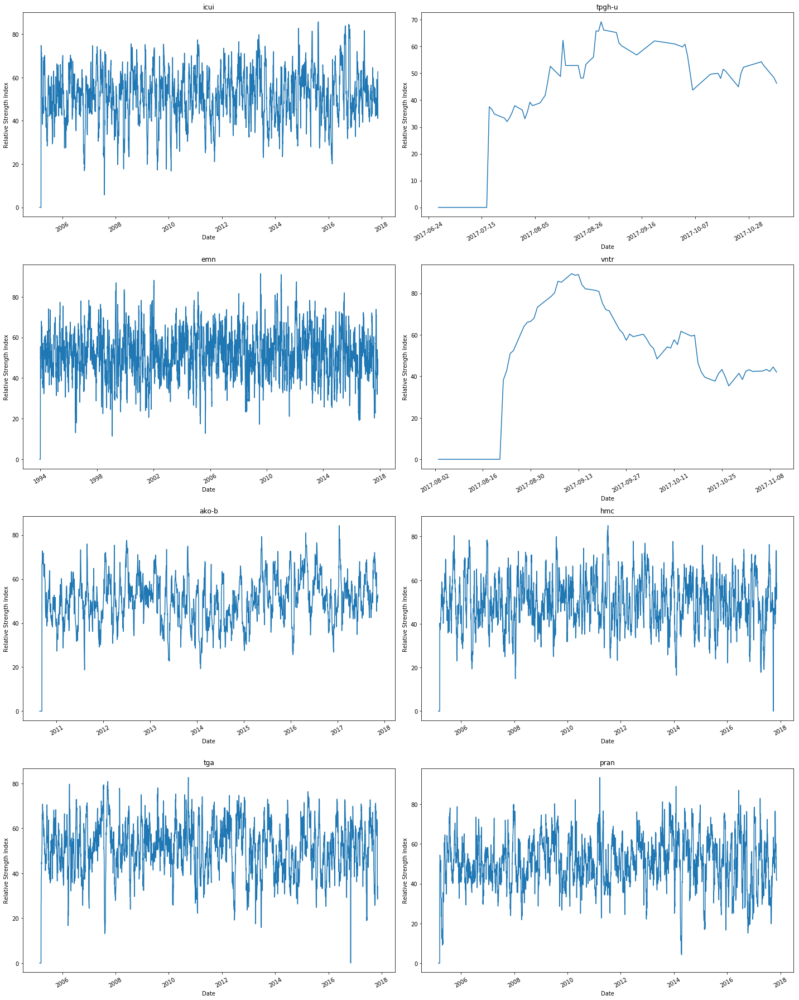

In [55]:
%matplotlib inline

# RSI Plot

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['RSI_14D'])
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Relative Strength Index")
    plt.xticks(rotation=30)
fig.tight_layout()


In plain English, this code generates a plot of the Relative Strength Index (RSI) for multiple stocks using the TechIndicator data.

First, %matplotlib inline is a directive that allows the plots to be displayed within the Jupyter notebook environment.

The code then creates a figure object fig with a specified size. Within this figure, a loop iterates over a range of 8, indicating the number of subplots to be created.

For each iteration, a subplot is created using the plt.subplot() function, and the RSI values (TechIndicator[i]['RSI_14D']) of the corresponding stock are plotted against the corresponding dates (TechIndicator[i].index).

The title of each subplot is set to the first value of the 'Label' column for the respective stock. The x-axis label is set to "Date", and the y-axis label is set to "Relative Strength Index". The x-axis tick labels are rotated by 30 degrees for better readability.

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure.

Overall, this code generates a visualization of the RSI for multiple stocks, allowing for a comparison of the RSI trends across different stocks over time.

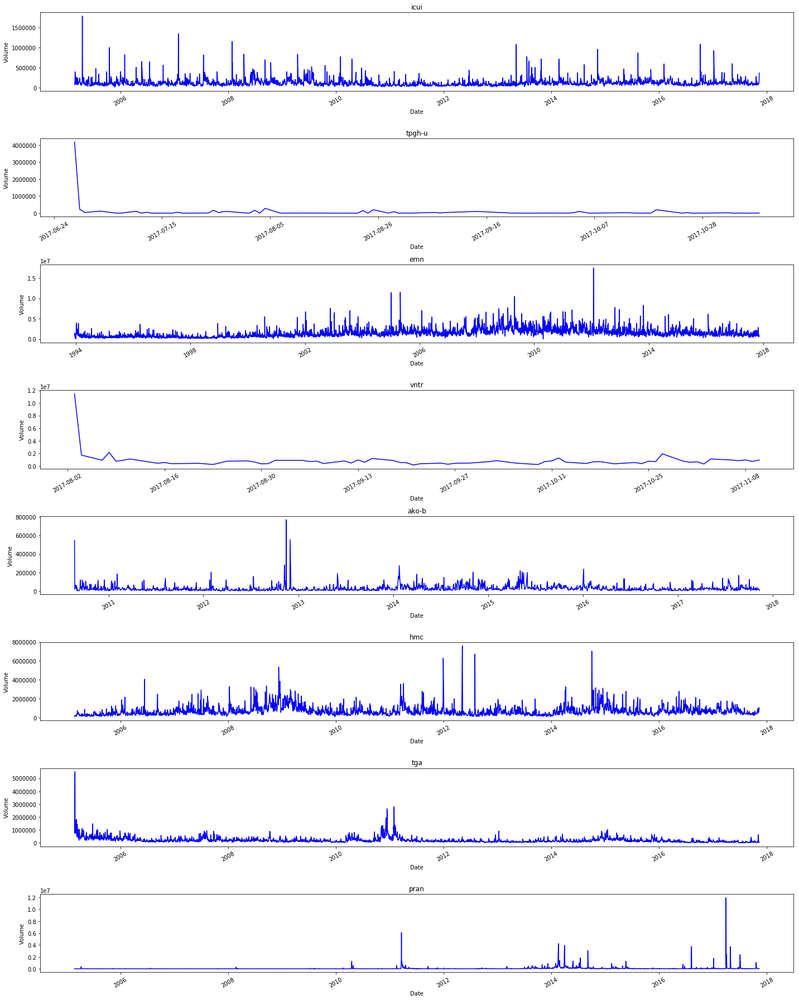

In [56]:
# Volume Plain plot
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume_plain'], 'b')
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Volume")
    plt.xticks(rotation=30)
fig.tight_layout()

In plain English, this code generates a plot of the volume data for multiple stocks using the TechIndicator dataset.

The code starts by creating a figure object fig with a specified size. Within this figure, a loop iterates over a range of 8, indicating the number of subplots to be created.

For each iteration, a subplot is created using the plt.subplot() function. The volume data (TechIndicator[i]['Volume_plain']) of the corresponding stock is plotted against the corresponding dates (TechIndicator[i].index) using a blue line.

The title of each subplot is set to the first value of the 'Label' column for the respective stock. The x-axis label is set to "Date", and the y-axis label is set to "Volume". The x-axis tick labels are rotated by 30 degrees for better readability.

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure.

Overall, this code generates a visualization of the volume data for multiple stocks, allowing for a comparison of the volume trends across different stocks over time.

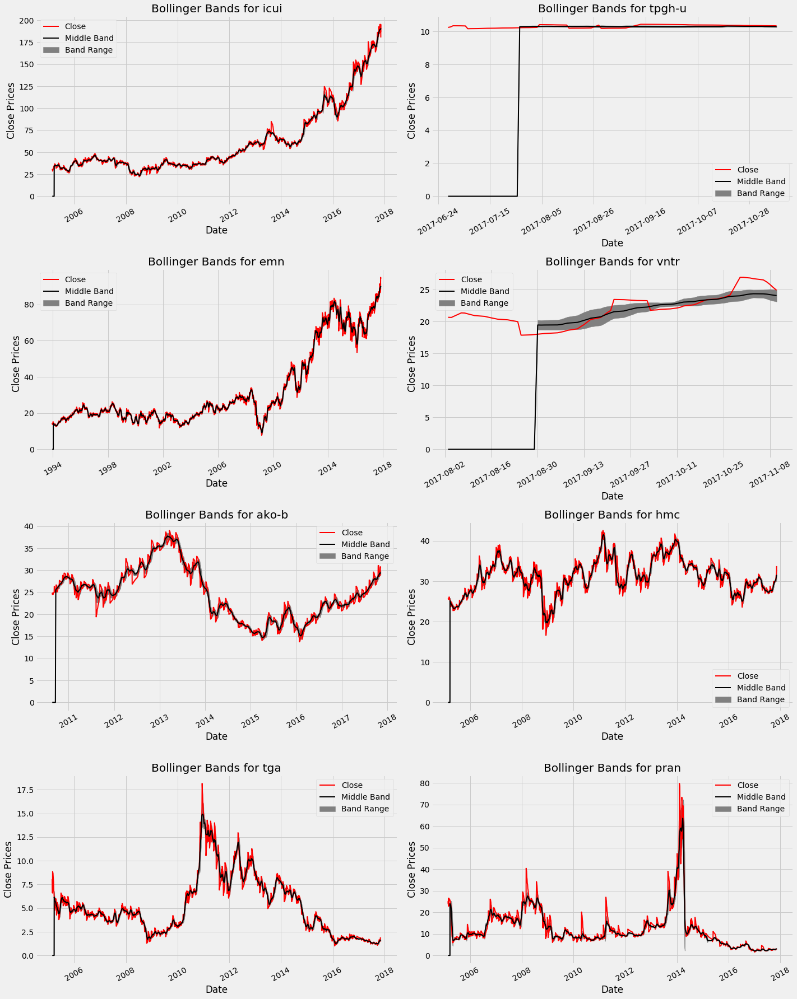

In [57]:
plt.style.use('fivethirtyeight')

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['BB_Upper_Band'], TechIndicator[i]['BB_Lower_Band'], color='grey', label="Band Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label="Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['BB_Middle_Band'], color='black', lw=2, label="Middle Band")
    ax.set_title("Bollinger Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()
#.dt.to_pydatetime()

In plain English, this code generates a plot of Bollinger Bands for multiple stocks using the TechIndicator dataset.

The code begins by setting the plot style to 'fivethirtyeight', which gives the plot a specific visual appearance.

A figure object fig is created with a specified size. Within this figure, a loop iterates over a range of 8, indicating the number of subplots to be created.

For each iteration, a subplot is created using the plt.subplot() function. The Bollinger Bands are plotted in the background as a filled area using the fill_between() function. The upper band values are taken from the 'BB_Upper_Band' column, and the lower band values are taken from the 'BB_Lower_Band' column. The color is set to grey, and the label is specified as "Band Range".

The closing prices (Close) for the corresponding stock are plotted as a line graph in red, indicating the price movement over time. The middle band values (BB_Middle_Band) are also plotted as a line graph in black, representing the average price trend.

The title of each subplot is set to "Bollinger Bands for [stock label]", where the stock label is extracted from the 'Label' column for the respective stock. A legend is added to the plot to differentiate the lines.

The x-axis label is set to "Date", and the y-axis label is set to "Close Prices". The x-axis tick labels are rotated by 30 degrees for better readability.

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure.

Overall, this code generates a visualization of Bollinger Bands for multiple stocks, allowing for a comparison of the price movements within the bands and identifying potential trends and volatility.

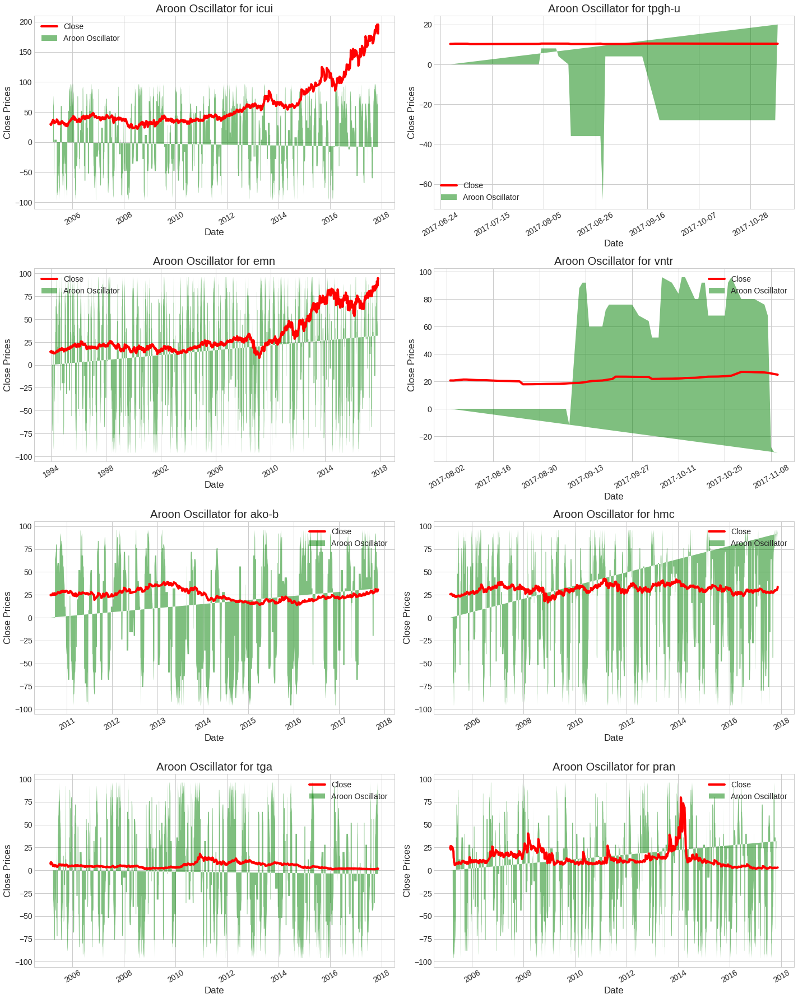

In [58]:
# Aroon Oscillator Plot
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill(TechIndicator[i].index, TechIndicator[i]['Aroon_Oscillator'],'g', alpha = 0.5, label = "Aroon Oscillator")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
    ax.set_title("Aroon Oscillator for " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

In plain English, this code generates a plot of the Aroon Oscillator for multiple stocks using the TechIndicator dataset.

The code begins by setting the plot style to 'seaborn-whitegrid', which gives the plot a specific visual appearance with a white grid background.

A figure object fig is created with a specified size. Within this figure, a loop iterates over a range of 8, indicating the number of subplots to be created.

For each iteration, a subplot is created using the plt.subplot() function. The Aroon Oscillator values (Aroon_Oscillator) are filled with green color using the fill() function. The transparency is set to 0.5 to allow for better visibility of underlying data. The label is specified as "Aroon Oscillator".

The closing prices (Close) for the corresponding stock are plotted as a line graph in red, indicating the price movement over time.

The title of each subplot is set to "Aroon Oscillator for [stock label]", where the stock label is extracted from the 'Label' column for the respective stock. A legend is added to the plot to differentiate the lines.

The x-axis label is set to "Date", and the y-axis label is set to "Close Prices". The x-axis tick labels are rotated by 30 degrees for better readability.

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure.

Overall, this code generates a visualization of the Aroon Oscillator for multiple stocks, allowing for a comparison of the oscillator values and the corresponding stock prices. It helps in identifying potential trends and the strength of those trends in the market.

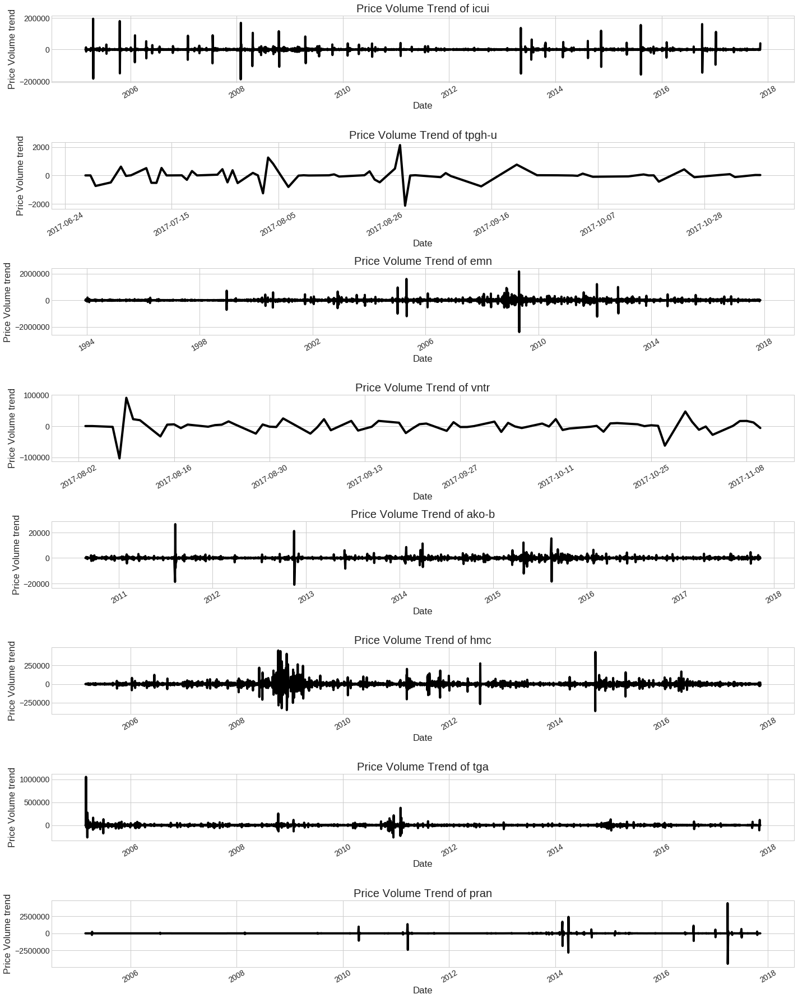

In [59]:
# PRice Volume Trend Plot
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['PVT'], 'black')
    ax.set_title("Price Volume Trend of " +str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Price Volume trend")
    plt.xticks(rotation=30)
fig.tight_layout()

In plain English, this code generates a plot of the Price Volume Trend (PVT) for multiple stocks using the TechIndicator dataset.

The code begins by creating a figure object fig with a specified size. Within this figure, a loop iterates over a range of 8, indicating the number of subplots to be created.

For each iteration, a subplot is created using the plt.subplot() function. The PVT values (PVT) for the corresponding stock are plotted as a line graph in black color using the plot() function.

The title of each subplot is set to "Price Volume Trend of [stock label]", where the stock label is extracted from the 'Label' column for the respective stock.

The x-axis label is set to "Date", and the y-axis label is set to "Price Volume Trend". The x-axis tick labels are rotated by 30 degrees for better readability.

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure.

Overall, this code generates a visualization of the Price Volume Trend for multiple stocks, allowing for a comparison of the trend values and their relationship with the corresponding stock prices and trading volumes. The PVT helps in assessing the strength of price movements in relation to trading volume, which can provide insights into market trends and potential buying or selling signals.

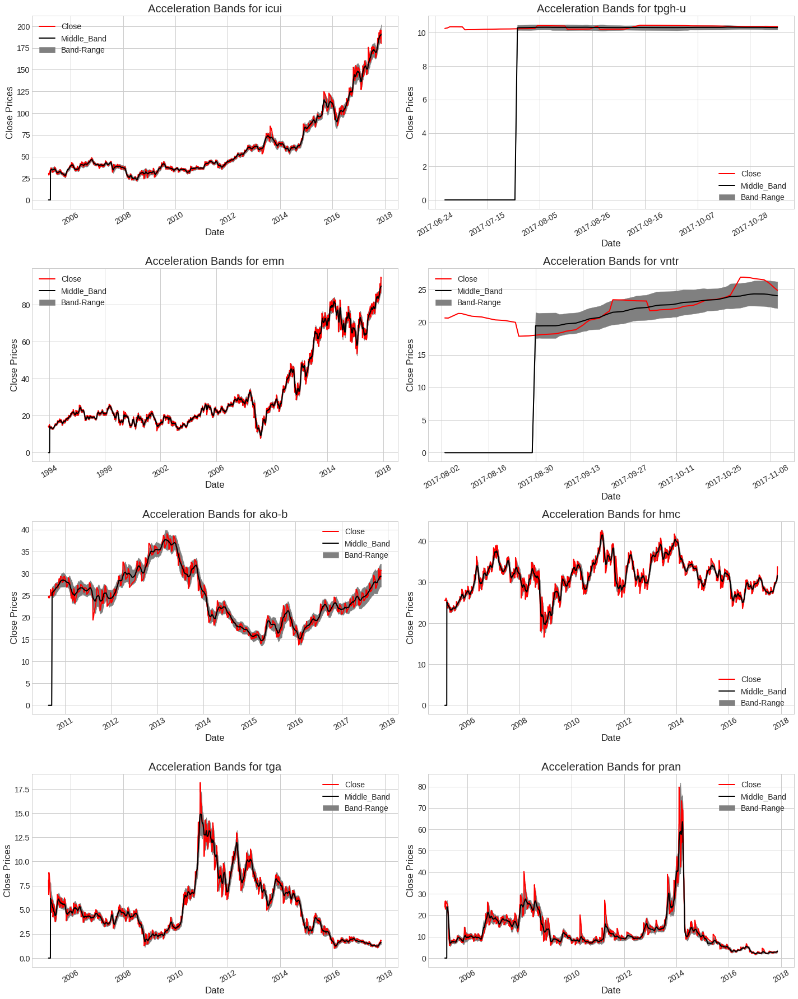

In [60]:
# Acceleration band Plot

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['AB_Upper_Band'], TechIndicator[i]['AB_Lower_Band'], color='grey', label = "Band-Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label = "Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['AB_Middle_Band'], color='black', lw=2, label="Middle_Band")
    ax.set_title("Acceleration Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()


In plain English, this code generates a plot of the Acceleration Bands for multiple stocks using the TechIndicator dataset.

The code begins by creating a figure object fig with a specified size. Within this figure, a loop iterates over a range of 8, indicating the number of subplots to be created.

For each iteration, a subplot is created using the plt.subplot() function. The area between the upper band (AB_Upper_Band) and the lower band (AB_Lower_Band) is filled with a grey color, representing the band range.

The adjusted closing price (Close) for the corresponding stock is plotted as a line graph in red color using the plot() function. Additionally, the middle band (AB_Middle_Band) is plotted as a line graph in black color.

The title of each subplot is set to "Acceleration Bands for [stock label]", where the stock label is extracted from the 'Label' column for the respective stock.

A legend is displayed to differentiate between the close price, middle band, and the band range. The x-axis label is set to "Date", and the y-axis label is set to "Close Prices". The x-axis tick labels are rotated by 30 degrees for better readability.

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure.

Overall, this code generates a visualization of the Acceleration Bands for multiple stocks, providing insights into the price volatility and potential trading ranges. The bands are calculated based on the closing prices and indicate potential support and resistance levels. Traders and analysts can use these bands to identify potential trading opportunities and make informed decisions.

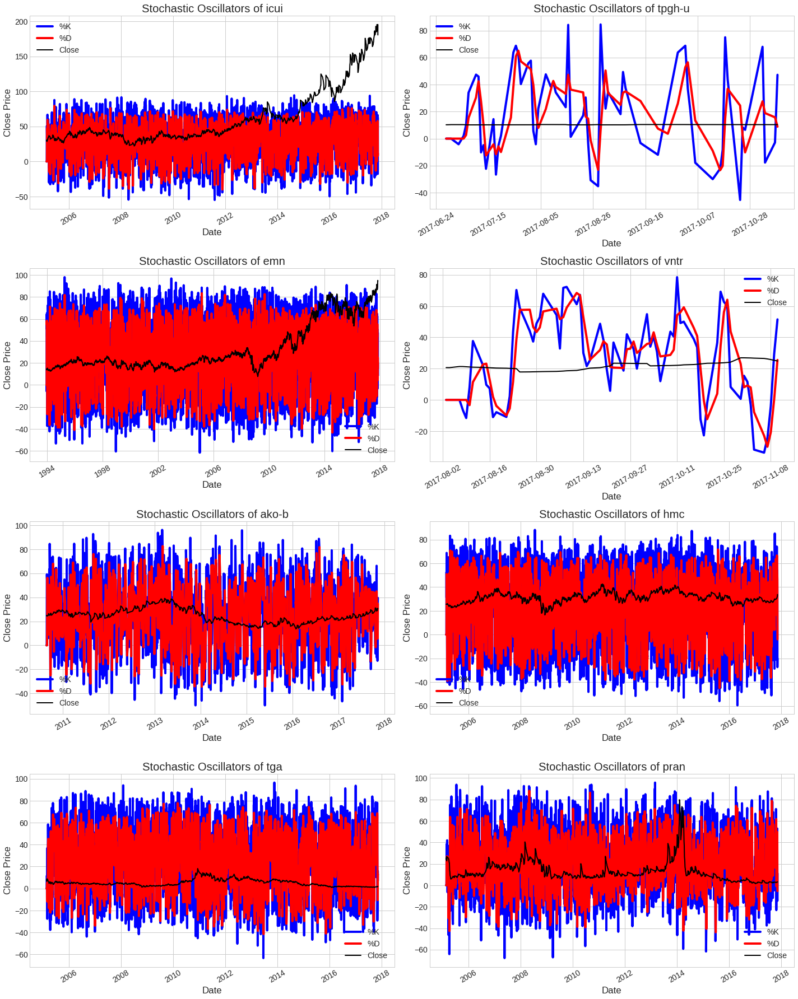

In [61]:
# Stochastic Oscillator plots
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOK'], 'blue', label="%K")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOD'], 'red', label="%D")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='black', lw=2, label = "Close")
    ax.set_title("Stochastic Oscillators of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

In plain English, this code generates plots of the Stochastic Oscillator for multiple stocks using the TechIndicator dataset.

The code begins by setting the plot style to a white grid using plt.style.use('seaborn-whitegrid'). Then, a figure object fig is created with a specified size.

Within the figure, a loop iterates over a range of 8, indicating the number of subplots to be created.

For each iteration, a subplot is created using the plt.subplot() function. The Stochastic Oscillator %K values (STOK) are plotted as a line graph in blue color, and the %D values (STOD) are plotted as a line graph in red color. Additionally, the closing price (Close) for the corresponding stock is plotted as a line graph in black color.

The title of each subplot is set to "Stochastic Oscillators of [stock label]", where the stock label is extracted from the 'Label' column for the respective stock.

A legend is displayed to differentiate between %K, %D, and the close price. The x-axis label is set to "Date", and the y-axis label is set to "Close Price". The x-axis tick labels are rotated by 30 degrees for better readability.

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure.

Overall, this code generates visualizations of the Stochastic Oscillator for multiple stocks. The Stochastic Oscillator is a momentum indicator that helps identify overbought and oversold conditions in the market. Traders and analysts can use these plots to gain insights into potential trend reversals and make informed trading decisions.

/opt/conda/lib/python3.6/site-packages/matplotlib/figure.py:1999: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


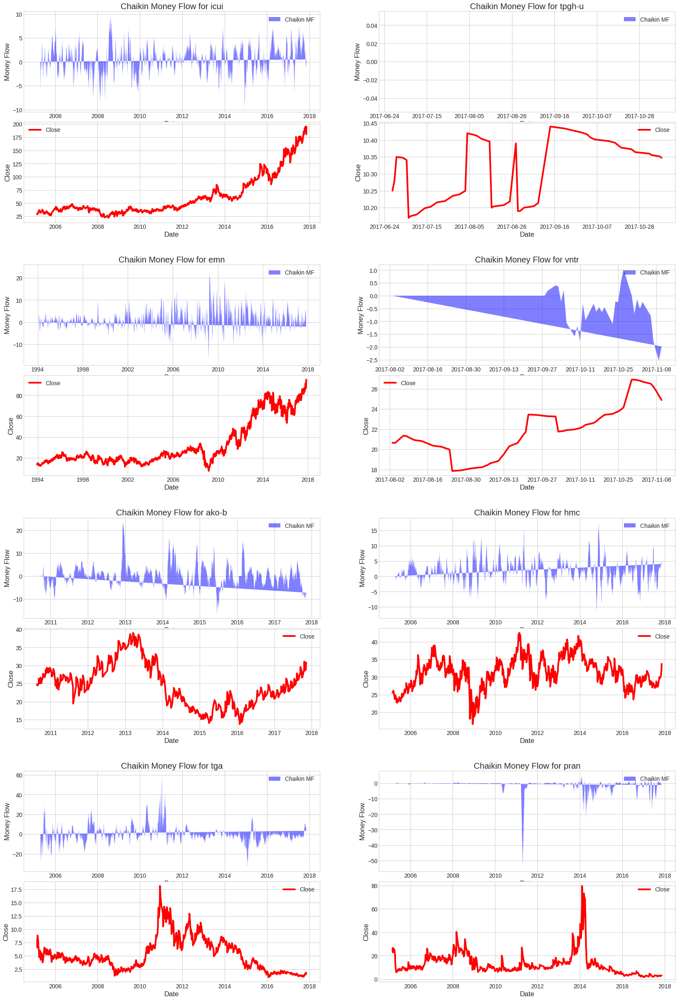

In [62]:
# Chaikin Money Flow Plots
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(25,40))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                    subplot_spec=outer[i], wspace=0.1, hspace=0.1)

    for j in range(2):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.fill(TechIndicator[i].index, TechIndicator[i]['Chaikin_MF'],'b', alpha = 0.5, label = "Chaikin MF")
            ax.set_title("Chaikin Money Flow for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Money Flow")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
            t = ax.set_ylabel("Close")
        ax.legend()
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

In plain English, this code generates plots of the Chaikin Money Flow (CMF) indicator for multiple stocks using the TechIndicator dataset.

The code begins by importing the gridspec module from matplotlib and creating a figure object fig with a specified size.

The figure is divided into a 4x2 grid using gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2). This grid will accommodate the subplots for each stock.

A nested loop is used to iterate over the grid and create subplots. The outer loop iterates over the rows of the grid, and the inner loop iterates over the columns. Each iteration creates a subplot within the corresponding cell of the grid.

For each subplot, the code checks the value of j in the inner loop. If j is 0, the Chaikin Money Flow values (Chaikin_MF) are filled as a blue area plot using ax.fill(). The title of the subplot is set to "Chaikin Money Flow for [stock label]", where the stock label is extracted from the 'Label' column for the respective stock. The y-axis label is set to "Money Flow".

If j is 1, the closing price (Close) for the corresponding stock is plotted as a line graph in red color using ax.plot(). The y-axis label is set to "Close".

A legend is displayed to differentiate between the Chaikin Money Flow and the close price. The x-axis label is set to "Date".

The subplots are added to the figure using fig.add_subplot(ax).

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure, ensuring proper spacing and alignment.

Overall, this code generates visualizations of the Chaikin Money Flow indicator for multiple stocks. The Chaikin Money Flow is a volume-based indicator that helps assess the accumulation or distribution of money in a stock. Traders and analysts can use these plots to identify potential buying or selling opportunities based on the flow of money in the market.

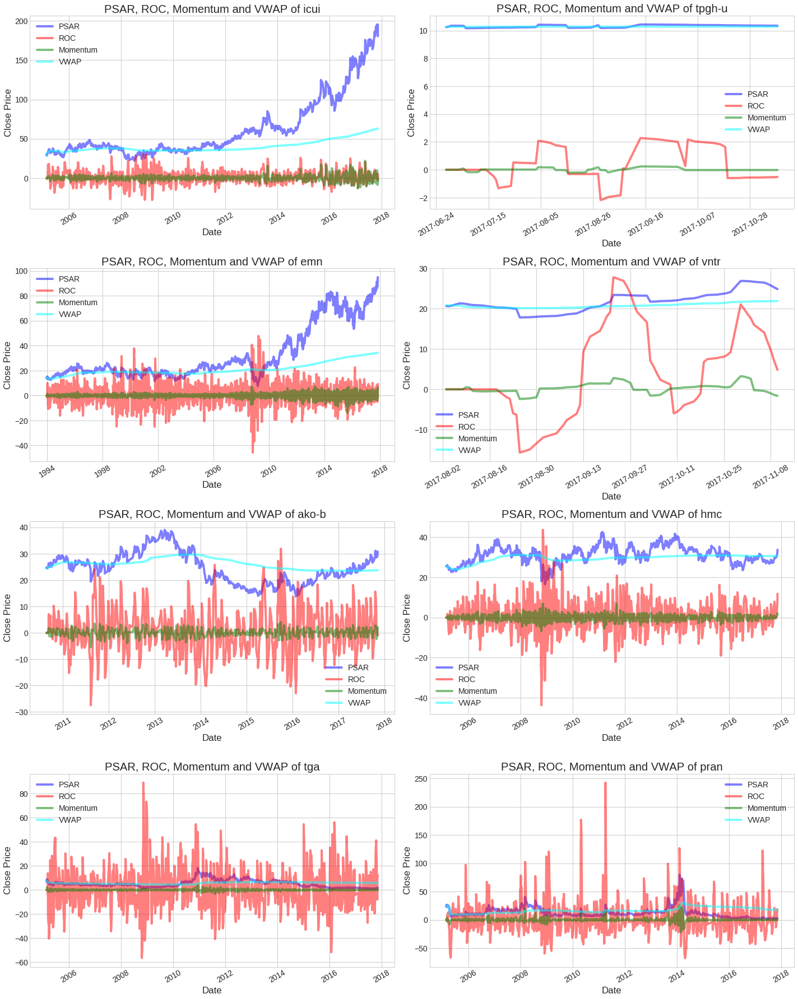

In [63]:
# Parabolic SAR, Rate of Change, Momentum and VWAP Plots
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['psar'], 'blue', label="PSAR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ROC'], 'red', label="ROC", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Momentum'], 'green', label="Momentum", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['VWAP'], 'cyan', label="VWAP", alpha = 0.5)
    ax.set_title("PSAR, ROC, Momentum and VWAP of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

In plain English, this code generates plots for multiple technical indicators including Parabolic SAR (PSAR), Rate of Change (ROC), Momentum, and Volume Weighted Average Price (VWAP) using the TechIndicator dataset.

The code starts by creating a figure object fig with a specified size.

It then enters a loop that iterates over each stock in the TechIndicator dataset. Within each iteration, a subplot is created using plt.subplot(4, 2, i+1) to allocate a specific cell in a 4x2 grid for the current stock.

Within each subplot, four indicators are plotted:

The Parabolic SAR values (psar) are plotted as a blue line graph using ax.plot().
The Rate of Change values (ROC) are plotted as a red line graph using ax.plot().
The Momentum values are plotted as a green line graph using ax.plot().
The Volume Weighted Average Price values (VWAP) are plotted as a cyan line graph using ax.plot().
Each subplot is given a title of "PSAR, ROC, Momentum, and VWAP of [stock label]", where the stock label is extracted from the 'Label' column for the respective stock.

A legend is displayed to differentiate between the four indicators. The x-axis label is set to "Date" and the y-axis label is set to "Close Price". The x-axis tick labels are rotated by 30 degrees for better readability.

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure, ensuring proper spacing and alignment.

Overall, this code generates visualizations of the Parabolic SAR, Rate of Change, Momentum, and Volume Weighted Average Price indicators for multiple stocks. These indicators provide insights into the trend, momentum, and volume dynamics of the stocks, helping traders and analysts make informed decisions.

/opt/conda/lib/python3.6/site-packages/matplotlib/figure.py:1999: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


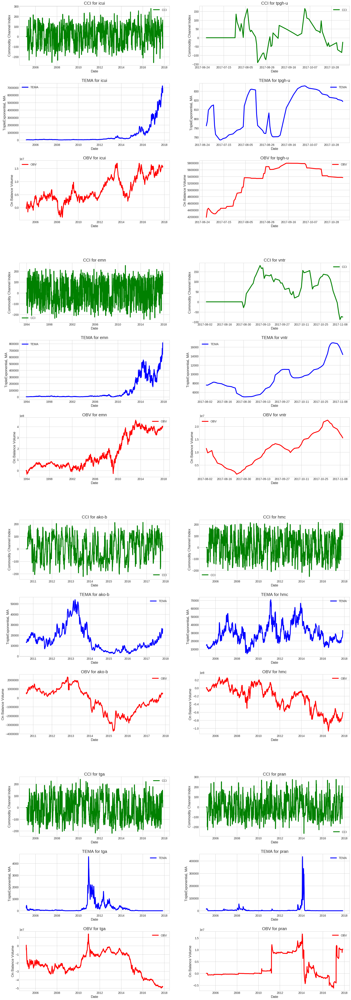

In [64]:
# Commodity Channel Index, Triple Exponential Moving Average On Banalance Volume Plots

fig = plt.figure(figsize=(25,80))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.3, hspace=0.3)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['CCI'], 'green', label="CCI")
            t = ax.set_title("CCI for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Commodity Channel Index")
        elif j == 1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['TEMA'], 'blue', label="TEMA")
            t = ax.set_title("TEMA for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("TripleExponentiaL MA")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['OBV'], 'red', label="OBV")
            t = ax.set_title("OBV for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("On Balance Volume")
        ax.legend()
        #ax.set_title("CCI, TEMA, OBV for " +str(techindi2[i]['Label'][0]))
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

In plain English, this code generates plots for three technical indicators: Commodity Channel Index (CCI), Triple Exponential Moving Average (TEMA), and On-Balance Volume (OBV) using the TechIndicator dataset.

The code begins by creating a figure object fig with a specified size.

It then enters a loop that iterates over each stock in the TechIndicator dataset. Within each iteration, a subplot grid is created using gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2) to allocate a specific cell in a 4x2 grid for the current stock.

Within each subplot grid, three subplots are created vertically using gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=outer[i], wspace=0.3, hspace=0.3).

Within each of the three subplots, a specific indicator is plotted:

The Commodity Channel Index values (CCI) are plotted as a green line graph using ax.plot().
The Triple Exponential Moving Average values (TEMA) are plotted as a blue line graph using ax.plot().
The On-Balance Volume values (OBV) are plotted as a red line graph using ax.plot().
Each subplot is given a title based on the indicator being plotted for the current stock, extracted from the 'Label' column. The y-axis label is set according to the respective indicator.

A legend is displayed to differentiate between the three indicators. The x-axis label is set to "Date".

The subplots are added to the figure using fig.add_subplot(ax).

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure, ensuring proper spacing and alignment.

Overall, this code generates visualizations of the Commodity Channel Index, Triple Exponential Moving Average, and On-Balance Volume indicators for multiple stocks. These indicators provide insights into the price momentum, volatility, and volume dynamics of the stocks, aiding in technical analysis and decision-making.

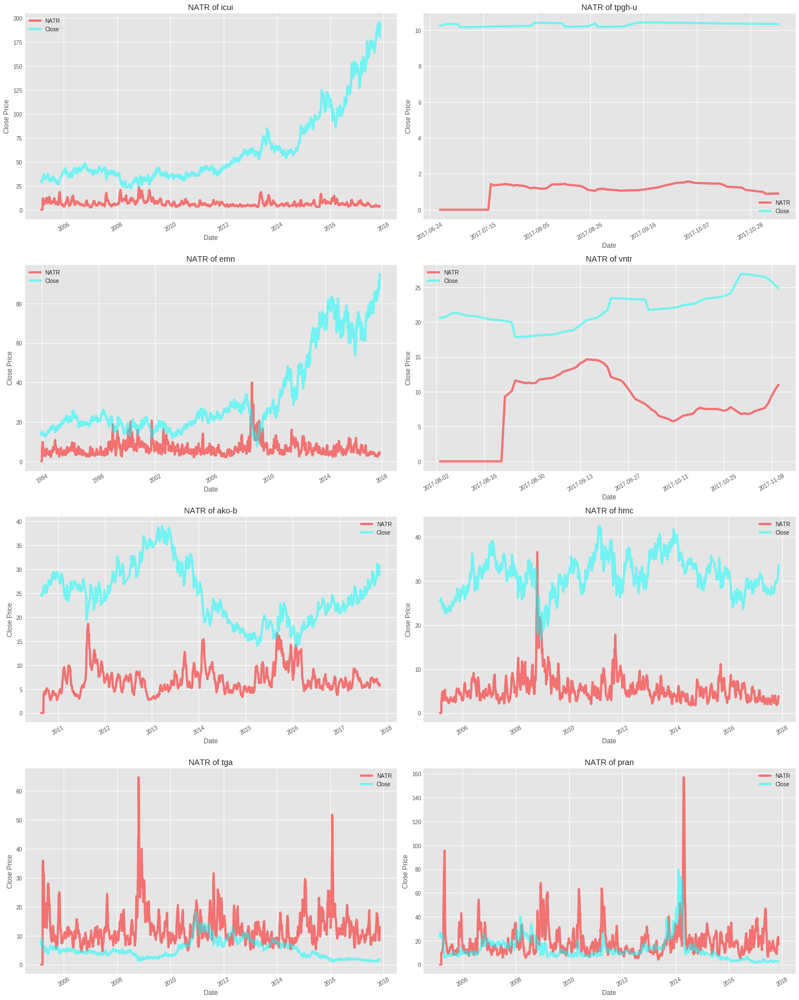

In [65]:
# Normalized Average True range Plots
plt.style.use('ggplot')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['NATR'], 'red', label="NATR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'cyan', label="Close", alpha = 0.5)
    ax.set_title("NATR of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

In plain English, this code generates plots for the Normalized Average True Range (NATR) indicator using the TechIndicator dataset.

The code begins by setting the plot style to 'ggplot'.

It then creates a figure object fig with a specified size.

Next, it enters a loop that iterates over each stock in the TechIndicator dataset. Within each iteration, a subplot is created using plt.subplot(4,2,i+1) to allocate a specific cell in a 4x2 grid for the current stock.

Within each subplot, two plots are created:

The NATR values are plotted as a red line graph using ax.plot().
The Closing Price values are plotted as a cyan line graph using ax.plot().
Each subplot is given a title based on the stock's label, extracted from the 'Label' column. The legend is displayed to differentiate between the NATR and Closing Price plots. The x-axis is labeled as "Date" and the y-axis as "Close Price".

The plt.xticks(rotation=30) command is used to rotate the x-axis tick labels by 30 degrees for better visibility.

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure, ensuring proper spacing and alignment.

Overall, this code generates visualizations of the Normalized Average True Range (NATR) indicator along with the Closing Price for multiple stocks. The NATR indicator helps assess market volatility, while the Closing Price provides an overview of the stock's price movements. These plots aid in technical analysis and understanding the price dynamics of the stocks.

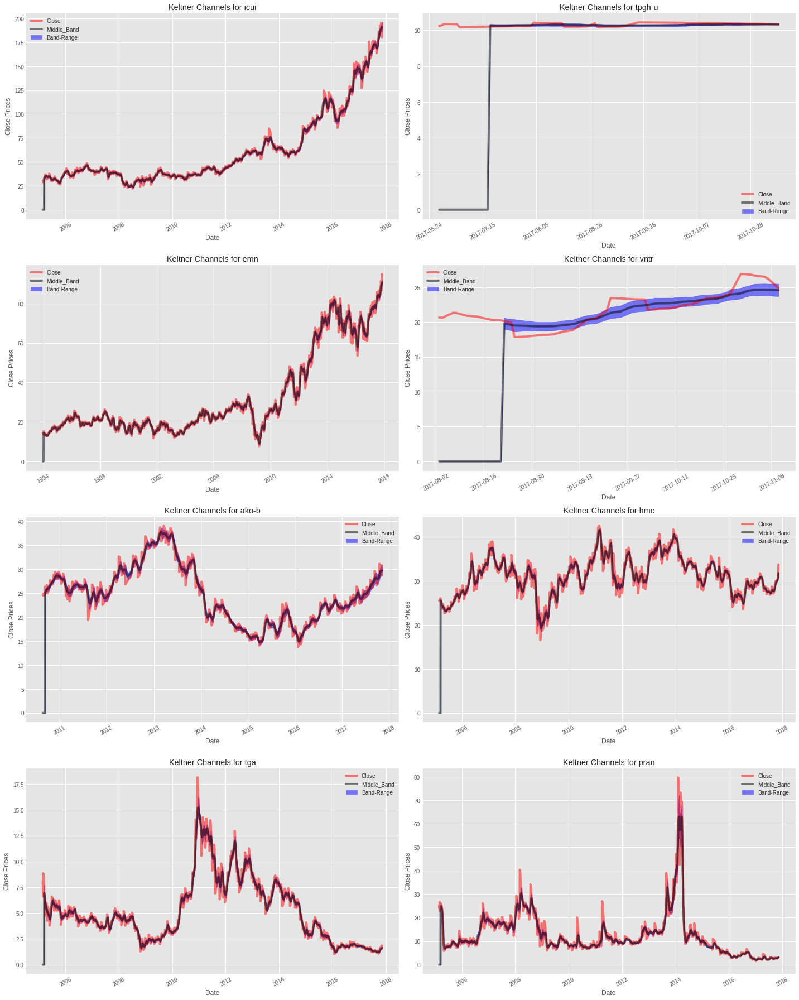

In [66]:
# Keltner Channels Plots

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['Kelch_Upper'], TechIndicator[i]['Kelch_Down'], 
                    color='blue', label = "Band-Range", alpha = 0.5)
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', label = "Close", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Kelch_Middle'], color='black', label="Middle_Band", alpha = 0.5)
    ax.set_title("Keltner Channels for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

In plain English, this code generates plots for the Keltner Channels indicator using the TechIndicator dataset.

The code begins by creating a figure object fig with a specified size.

Next, it enters a loop that iterates over each stock in the TechIndicator dataset. Within each iteration, a subplot is created using plt.subplot(4,2,i+1) to allocate a specific cell in a 4x2 grid for the current stock.

Within each subplot, three plots are created:

The area between the upper and lower bands of the Keltner Channels is filled with a blue color using ax.fill_between().
The Closing Price values are plotted as a red line graph using ax.plot().
The middle band values of the Keltner Channels are plotted as a black line graph using ax.plot().
Each subplot is given a title based on the stock's label, extracted from the 'Label' column. The legend is displayed to differentiate between the band range, Closing Price, and middle band plots. The x-axis is labeled as "Date" and the y-axis as "Close Prices".

The plt.xticks(rotation=30) command is used to rotate the x-axis tick labels by 30 degrees for better visibility.

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure, ensuring proper spacing and alignment.

Overall, this code generates visualizations of the Keltner Channels indicator for multiple stocks. The Keltner Channels consist of an upper band, lower band, and middle band, which help identify potential price breakouts and support/resistance levels. The Closing Price is also included for reference. These plots assist in technical analysis and understanding the price behavior within the Keltner Channels.

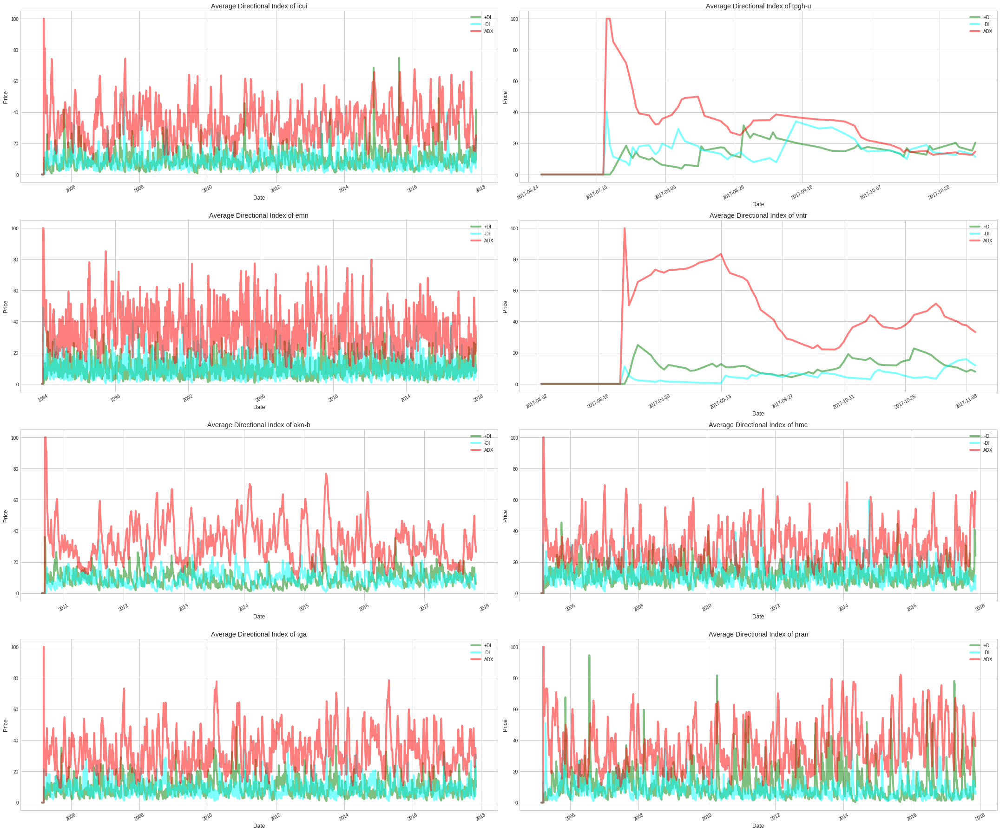

In [67]:
# Average Directional Index

plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(30,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['plusDI'], 'green', label="+DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['minusDI'], 'cyan', label="-DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ADX'], 'red', label="ADX", alpha = 0.5)
    ax.set_title("Average Directional Index of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

In plain English, this code generates plots for the Average Directional Index (ADX) indicator using the TechIndicator dataset.

The code begins by setting the style of the plot to 'seaborn-whitegrid' using plt.style.use(). Then, a figure object fig is created with a specified size.

Next, it enters a loop that iterates over each stock in the TechIndicator dataset. Within each iteration, a subplot is created using plt.subplot(4,2,i+1) to allocate a specific cell in a 4x2 grid for the current stock.

Within each subplot, three plots are created:

The +DI values are plotted as a green line graph using ax.plot().
The -DI values are plotted as a cyan line graph using ax.plot().
The ADX values are plotted as a red line graph using ax.plot().
Each subplot is given a title based on the stock's label, extracted from the 'Label' column. The legend is displayed to differentiate between the +DI, -DI, and ADX plots. The x-axis is labeled as "Date" and the y-axis as "Price".

The plt.xticks(rotation=30) command is used to rotate the x-axis tick labels by 30 degrees for better visibility.

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure, ensuring proper spacing and alignment.

Overall, this code generates visualizations of the Average Directional Index (ADX) indicator for multiple stocks. The +DI and -DI lines represent the directional movement of the price, while the ADX line indicates the strength of the trend. These plots help traders and analysts understand the trend and potential momentum in the price movement.

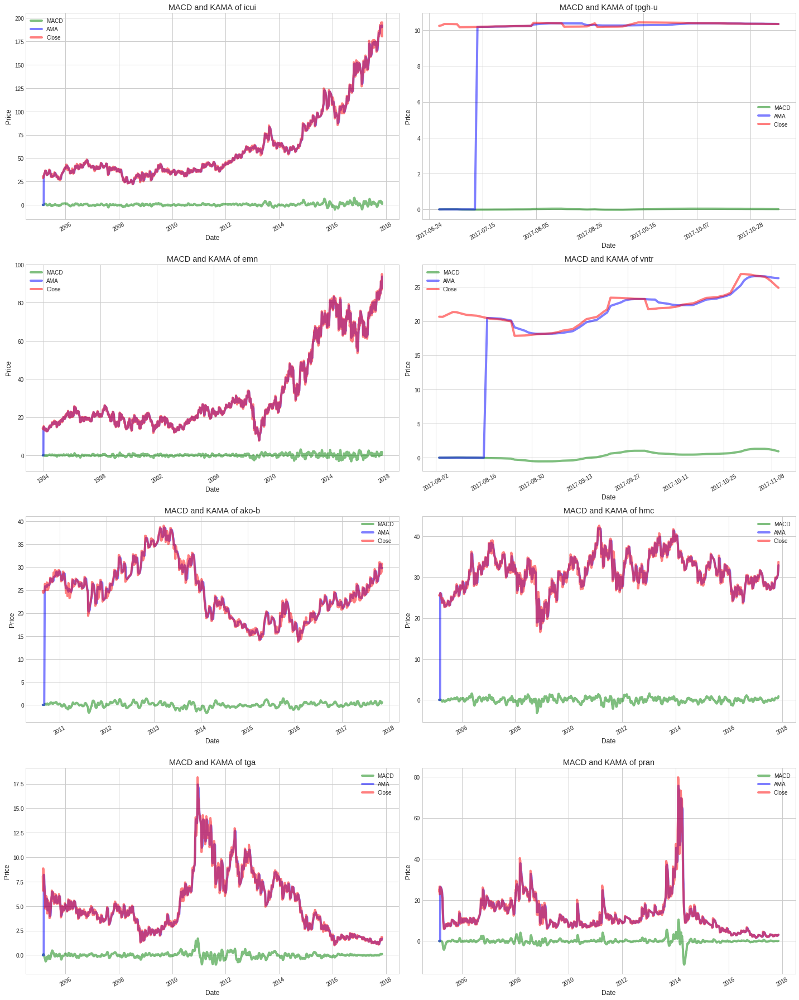

In [68]:
# Moving Average Convergence Divergence, Adaptive Moving Avergae Plots
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['MACD'], 'green', label="MACD", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['KAMA'], 'blue', label="AMA", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'red', label="Close", alpha = 0.5)
    ax.set_title("MACD and KAMA of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

In plain English, this code generates plots for the Moving Average Convergence Divergence (MACD) and Adaptive Moving Average (AMA) indicators using the TechIndicator dataset.

The code begins by setting the style of the plot to 'seaborn-whitegrid' using plt.style.use(). Then, a figure object fig is created with a specified size.

Next, it enters a loop that iterates over each stock in the TechIndicator dataset. Within each iteration, a subplot is created using plt.subplot(4,2,i+1) to allocate a specific cell in a 4x2 grid for the current stock.

Within each subplot, three plots are created:

The MACD values are plotted as a green line graph using ax.plot().
The AMA values are plotted as a blue line graph using ax.plot().
The closing prices are plotted as a red line graph using ax.plot().
Each subplot is given a title based on the stock's label, extracted from the 'Label' column. The legend is displayed to differentiate between the MACD, AMA, and closing price plots. The x-axis is labeled as "Date" and the y-axis as "Price".

The plt.xticks(rotation=30) command is used to rotate the x-axis tick labels by 30 degrees for better visibility.

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure, ensuring proper spacing and alignment.

Overall, this code generates visualizations of the Moving Average Convergence Divergence (MACD) and Adaptive Moving Average (AMA) indicators for multiple stocks. These plots provide insights into the trend, momentum, and potential crossover points in the price movement, aiding traders and analysts in their decision-making process.

/opt/conda/lib/python3.6/site-packages/matplotlib/figure.py:1999: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


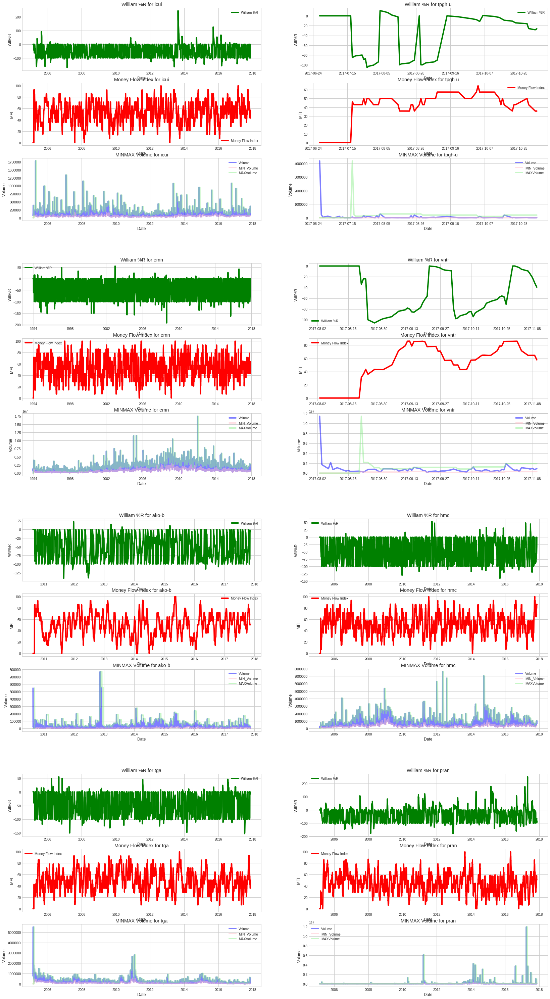

In [69]:
# William %R, Money Flow
fig = plt.figure(figsize=(25,50))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.2, hspace=0.2)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['WillR'], 'green', label="William %R")
            t = ax.set_title("William %R for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Will%R")
        elif j ==1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Money_Flow_Index'], 'red', label="Money Flow Index")
            
            t = ax.set_title("Money Flow Index for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("MFI")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume'], 'blue', label="Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MIN_Volume'], 'pink', label="MIN_Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MAX_Volume'], 'lightgreen', label="MAXVolume",  alpha = 0.5)
            t = ax.set_title("MINMAX Volume for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Volume")
        ax.legend()
        #ax.set_title("CCI, TEMA, OBV for " +str(techindi2[i]['Label'][0]))
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

In plain English, this code generates plots for the William %R indicator, Money Flow Index (MFI), and volume-related metrics using the TechIndicator dataset.

The code begins by creating a figure object fig with a specified size.

Next, it enters a nested loop to create subplots for each stock in the TechIndicator dataset. The outer loop iterates over the stocks, and the inner loop creates three subplots within each stock subplot.

Within each subplot, different plots are created based on the value of j in the inner loop:

When j is 0, the William %R values are plotted as a green line graph using ax.plot(). The subplot title is set to "William %R" for the corresponding stock, and the y-axis label is set to "Will%R".
When j is 1, the Money Flow Index (MFI) values are plotted as a red line graph using ax.plot(). The subplot title is set to "Money Flow Index" for the corresponding stock, and the y-axis label is set to "MFI".
When j is 2, multiple volume-related metrics are plotted: the overall volume as a blue line graph, the minimum volume as a pink line graph, and the maximum volume as a light green line graph. The subplot title is set to "MINMAX Volume" for the corresponding stock, and the y-axis label is set to "Volume".
Each subplot is given a title based on the stock's label, extracted from the 'Label' column. Legends are displayed to differentiate between the different plots within each subplot. The x-axis is labeled as "Date".

The fig.add_subplot(ax) command is used to add each subplot to the figure.

Finally, fig.tight_layout() is used to optimize the layout of the subplots within the figure, ensuring proper spacing and alignment.

Overall, this code generates visualizations of the William %R indicator, Money Flow Index (MFI), and volume-related metrics for multiple stocks. These plots provide insights into the overbought/oversold conditions, money flow dynamics, and volume patterns, helping traders and analysts understand the market sentiment and potential price reversals.

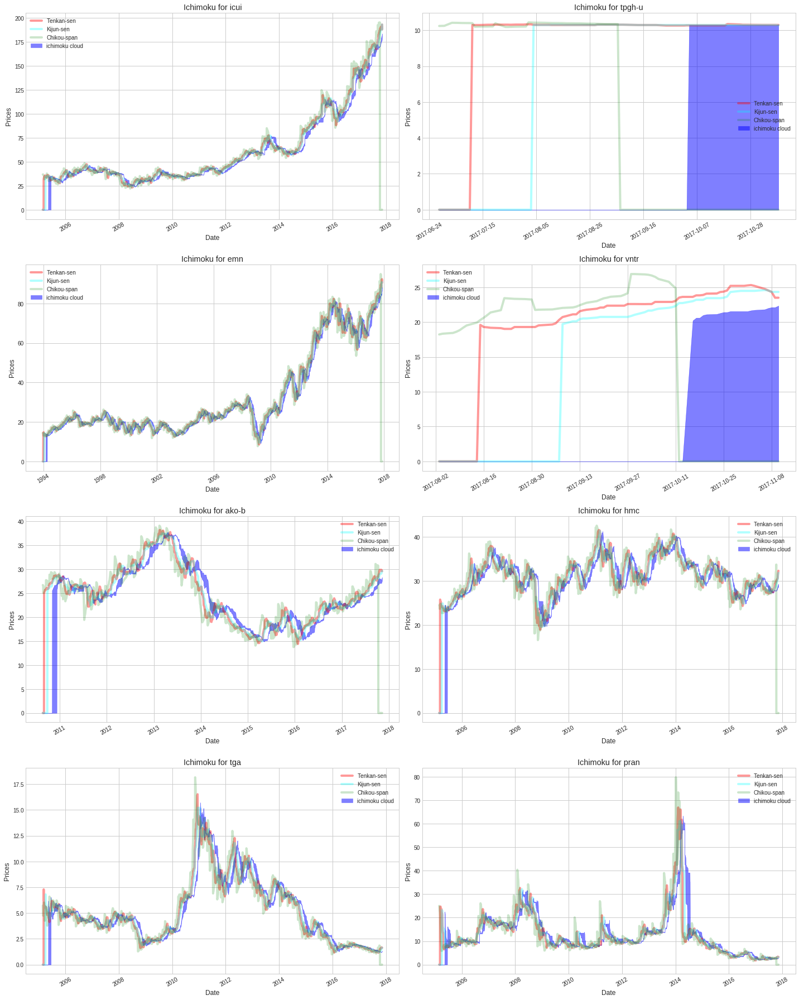

In [70]:
# ichimoku Plots turning_line	standard_line	ichimoku_span1	ichimoku_span2	chikou_span

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['ichimoku_span1'], TechIndicator[i]['ichimoku_span2'], 
                    color='blue', label = "ichimoku cloud", alpha = 0.5)
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['turning_line'], color='red', label = "Tenkan-sen", alpha = 0.4)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['standard_line'], color='cyan', label="Kijun-sen", alpha = 0.3)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['chikou_span'], color='green', label="Chikou-span", alpha = 0.2)
    ax.set_title("Ichimoku for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

In plain English, this code generates plots for the Ichimoku Cloud indicator using the 'TechIndicator' dataset.

The code starts by creating a figure object fig with a specified size.

Next, it enters a loop to create subplots for each stock in the TechIndicator dataset. The loop iterates over the range of 8, representing the indices of the stocks.

Within each subplot, the following plots are created:

The Ichimoku Cloud is plotted as a filled blue area between the 'ichimoku_span1' and 'ichimoku_span2'. This area represents the cloud formed by the leading span lines.
The Tenkan-sen line, represented by the 'turning_line', is plotted as a red line.
The Kijun-sen line, represented by the 'standard_line', is plotted as a cyan line.
The Chikou-span line, represented by the 'chikou_span', is plotted as a green line.
The subplot is given a title based on the stock's label, extracted from the 'Label' column. Legends are displayed to differentiate between the different plots within each subplot. The x-axis is labeled as "Date" and the y-axis as "Prices". The x-axis tick labels are rotated by 30 degrees for better readability.

The fig.tight_layout() command is used to optimize the layout of the subplots within the figure, ensuring proper spacing and alignment.

Overall, this code generates visualizations of the Ichimoku Cloud indicator, including the cloud area, Tenkan-sen, Kijun-sen, and Chikou-span lines for multiple stocks. These plots provide insights into the trend, support/resistance levels, and potential reversal points, assisting traders and analysts in making informed trading decisions.

I have also tried prediction of movement of stock market based on this data. You can refer to that kernel here: https://www.kaggle.com/kratisaxena/lstm-gru-models-for-stock-movement-analysis